
# Basic GAN Implementation

## Import libraries

In [2]:
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torchvision.datasets import MNIST

import matplotlib.pyplot as plt

from tqdm.auto import tqdm

## Model Section

### Define Generator Network

In [3]:
## get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [4]:
## Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

### Get Noise

In [5]:
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    return torch.randn(n_samples,z_dim,device=device)

### Define Discriminator Network

In [6]:
## get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
         nn.Linear(input_dim, output_dim),
         nn.LeakyReLU(0.2, inplace=True)
    )

In [7]:
## Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

### Training

In [8]:
# Setting parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 100 # try for more #200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

In [9]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [10]:
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     Steps:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.

    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2

    return disc_loss

In [11]:
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     Steps:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real

    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    
    return gen_loss

In [12]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.4322525466680527, discriminator loss: 0.4253014394044877


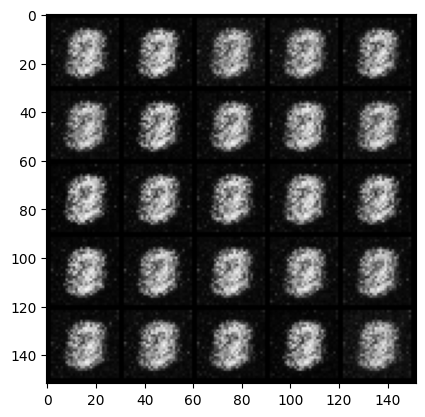

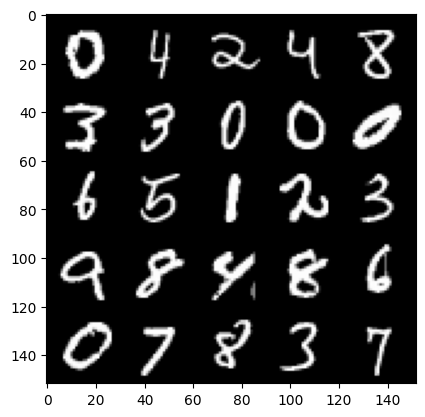

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.7263674924373635, discriminator loss: 0.28871185964345936


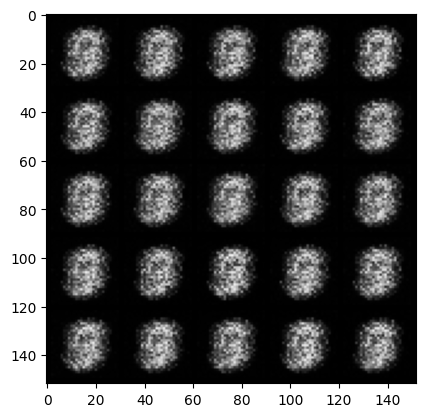

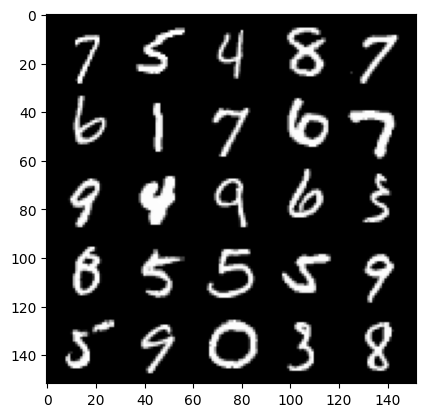

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 2.023298891067506, discriminator loss: 0.17094581353664404


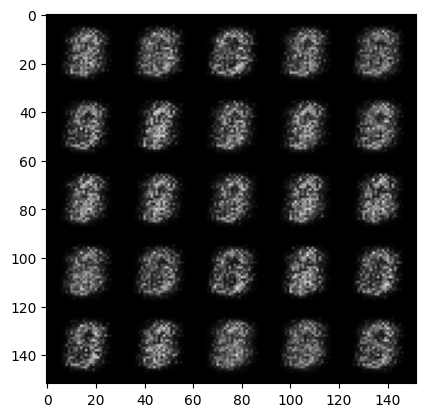

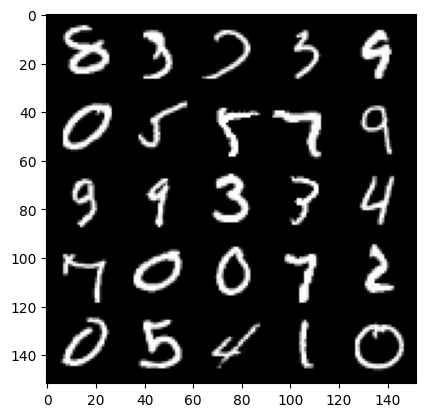

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.6980418026447297, discriminator loss: 0.2137114987373354


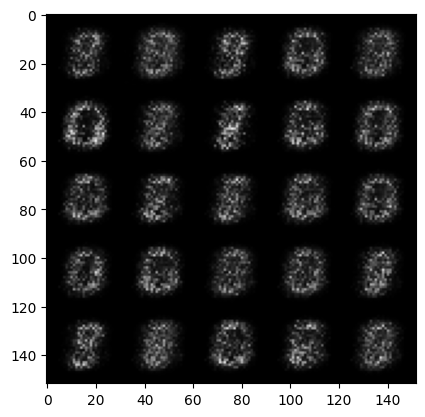

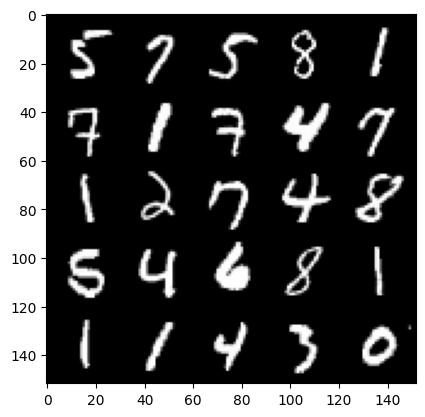

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.6773032248020188, discriminator loss: 0.20238640746474262


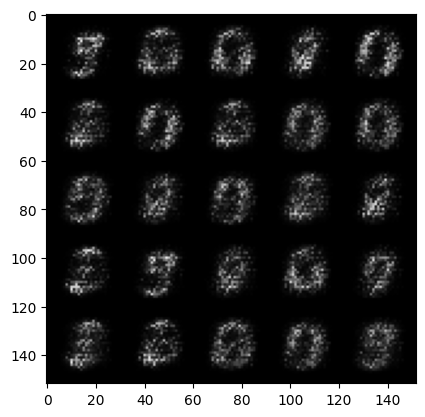

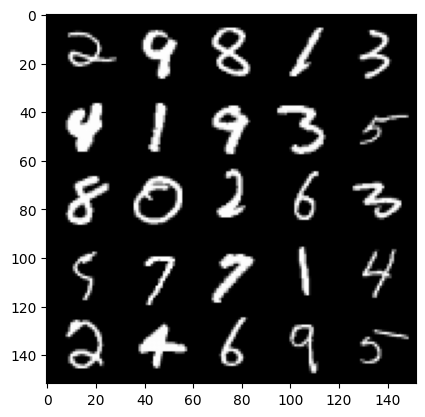

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.9005943377017984, discriminator loss: 0.1747125975489617


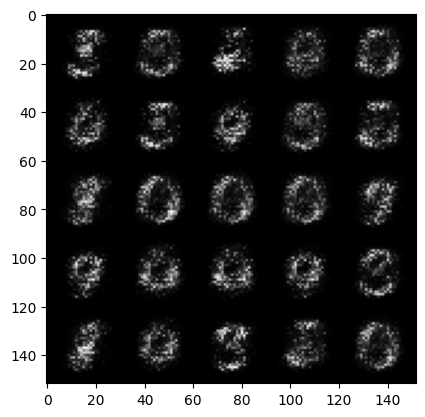

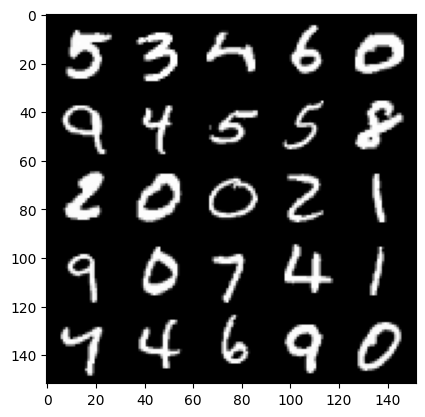

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.2727998251914996, discriminator loss: 0.13858755531907083


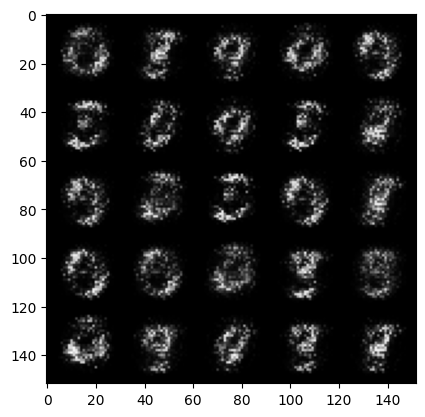

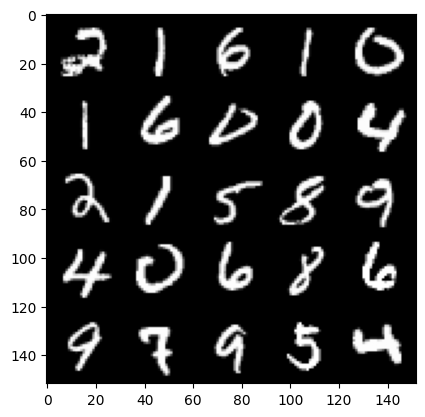

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.705459383487703, discriminator loss: 0.11730732814967637


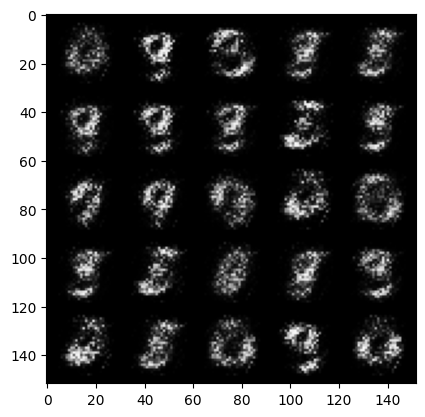

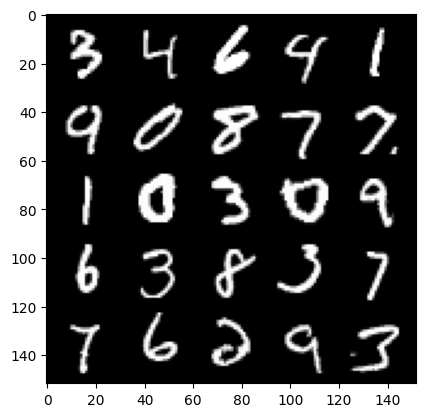

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.0651250228881817, discriminator loss: 0.09680276248604046


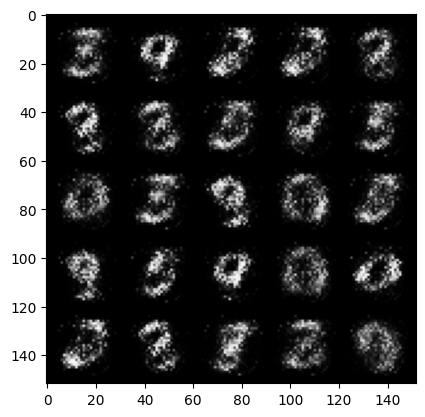

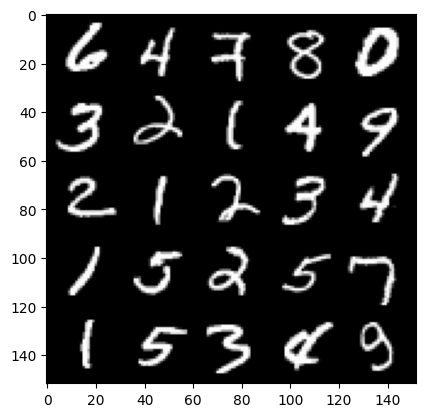

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.3574803228378314, discriminator loss: 0.08530753603577612


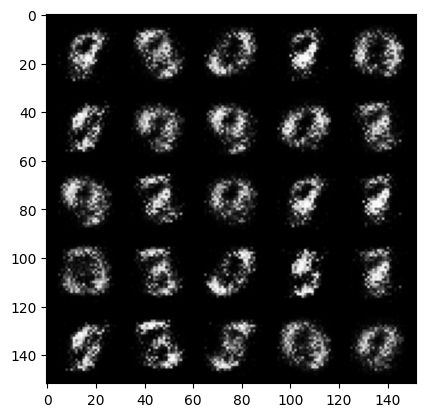

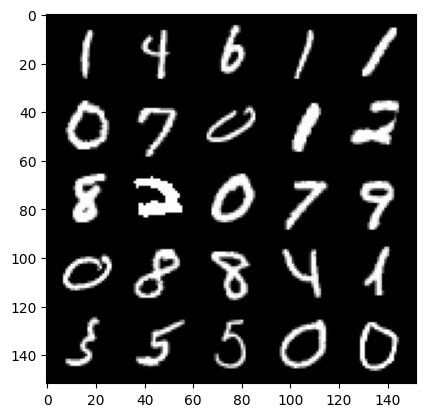

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.535262203693388, discriminator loss: 0.07938282808661472


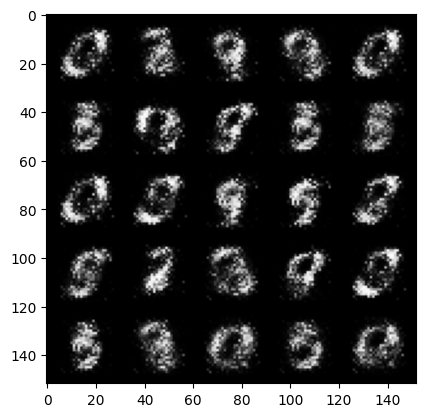

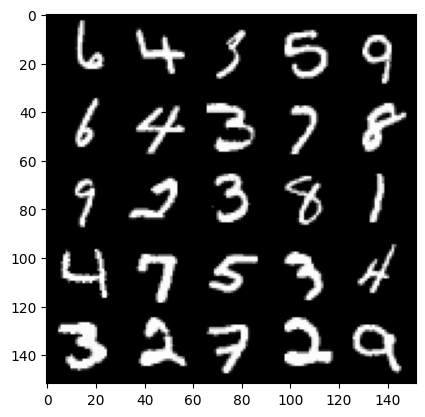

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.7791849665641744, discriminator loss: 0.06216583244502546


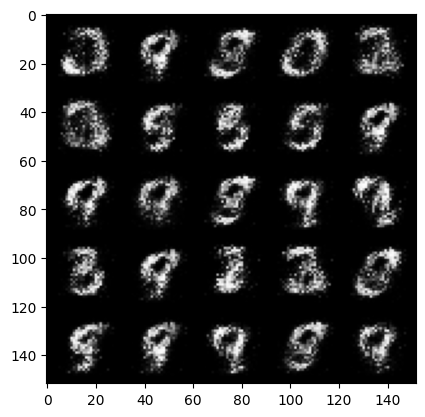

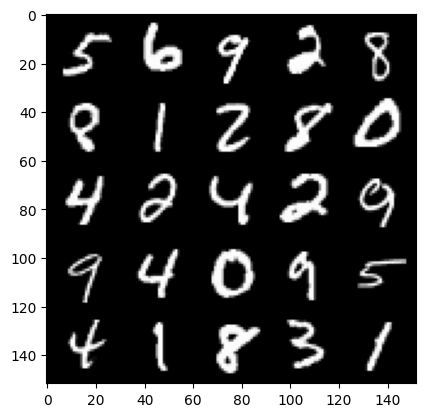

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.920033007144928, discriminator loss: 0.062368212871253534


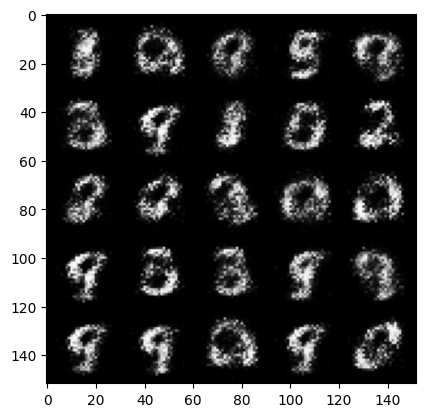

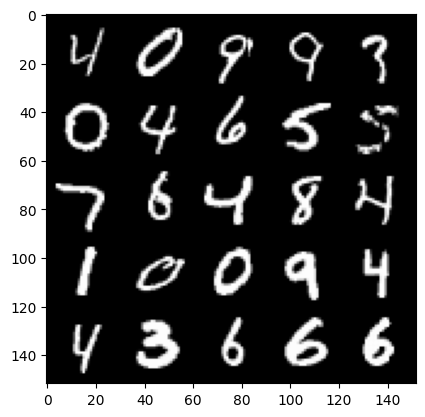

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.072609362602231, discriminator loss: 0.055997517101466665


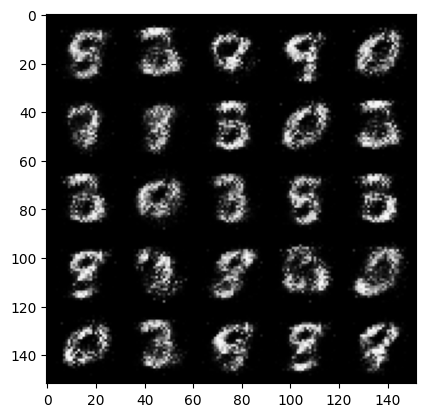

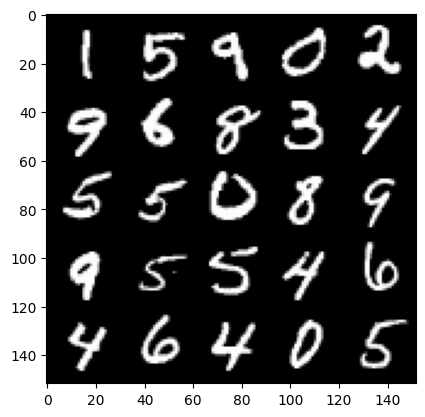

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.0401424627304054, discriminator loss: 0.05882991673052309


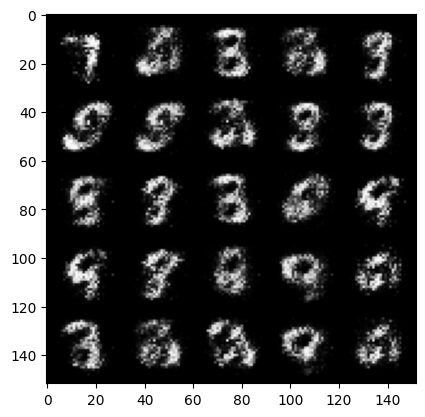

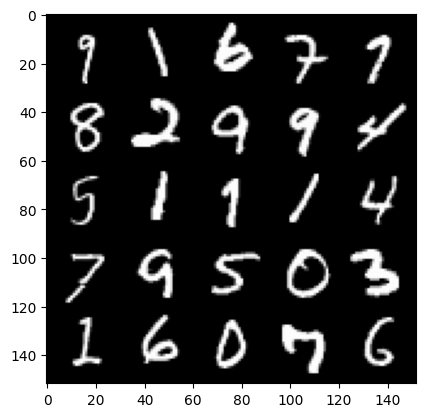

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 3.997931383132933, discriminator loss: 0.05956772546470166


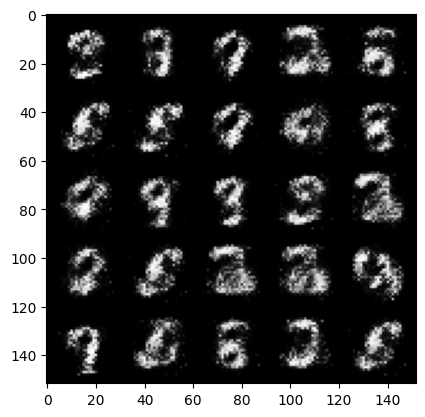

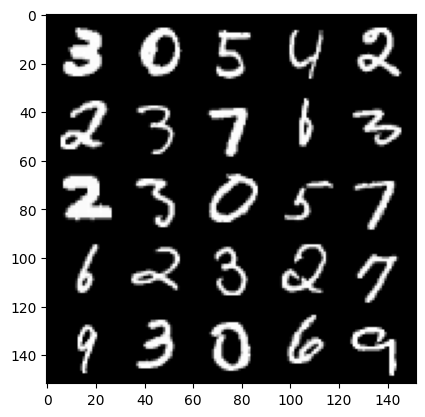

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.2208314952850365, discriminator loss: 0.050452483624219835


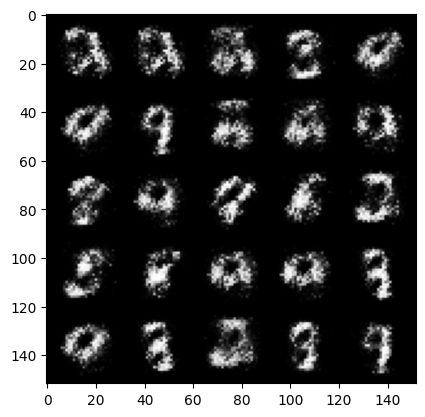

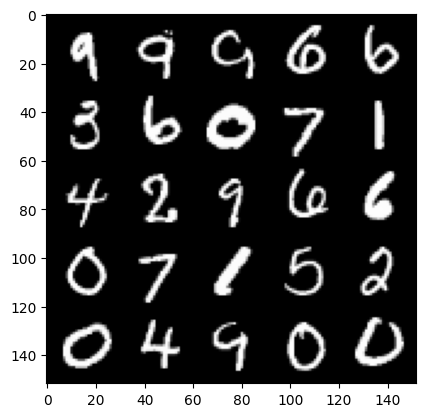

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.222437902927399, discriminator loss: 0.05470268401131033


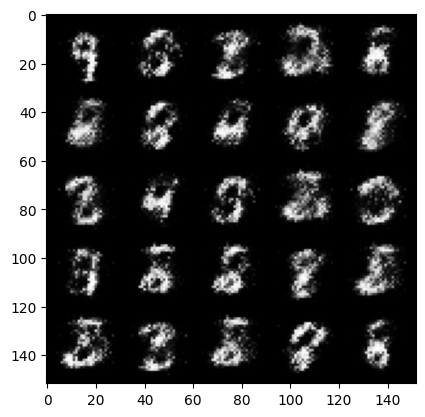

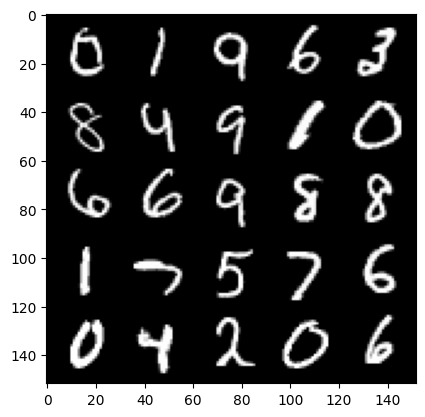

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.239981334686276, discriminator loss: 0.05480839645490052


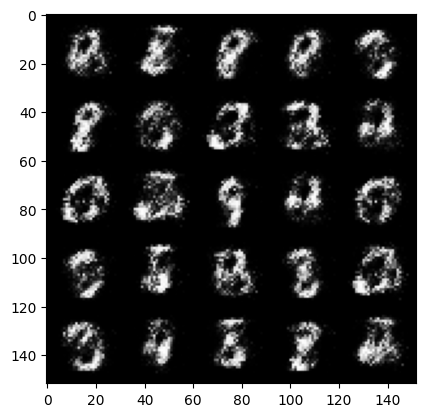

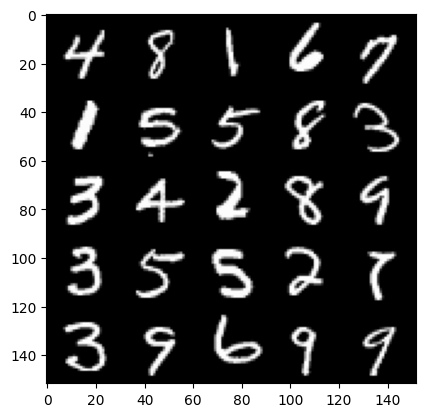

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.227016761302951, discriminator loss: 0.07047608072310678


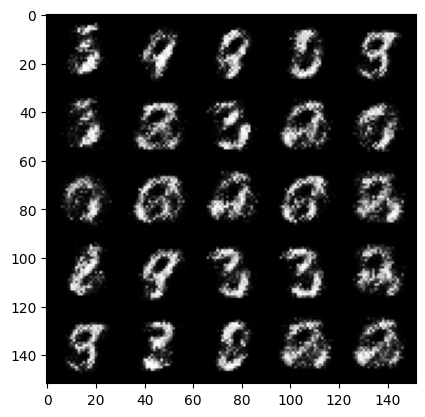

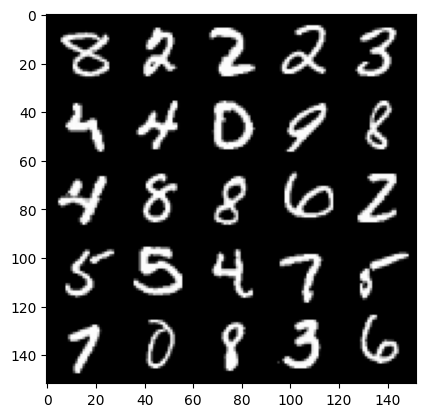

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.216188602447513, discriminator loss: 0.07214371525496237


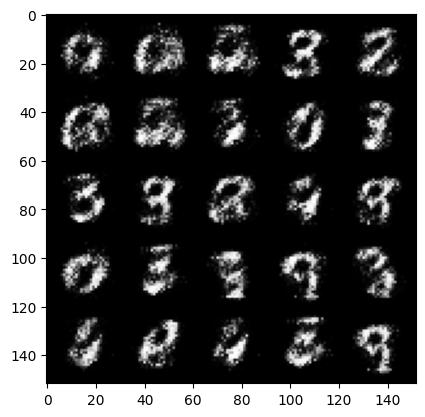

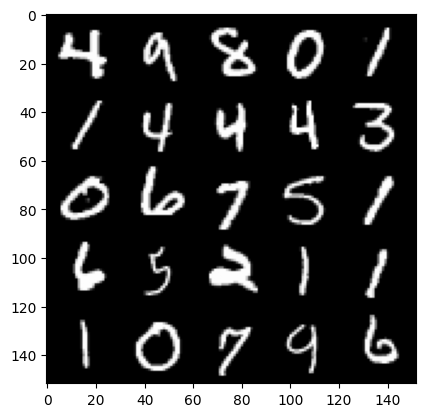

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.079031108379369, discriminator loss: 0.08048157390952107


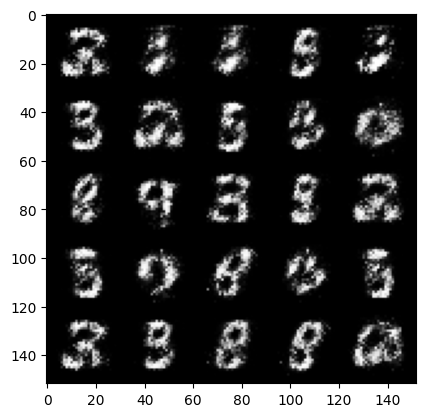

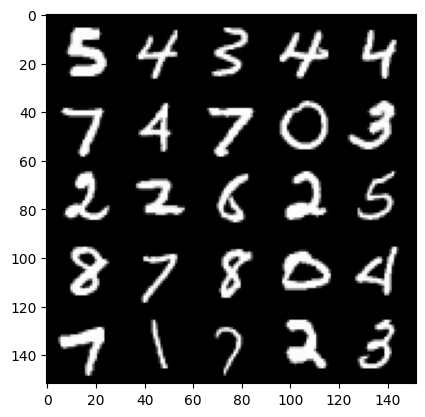

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 3.798335380554199, discriminator loss: 0.08896813759207735


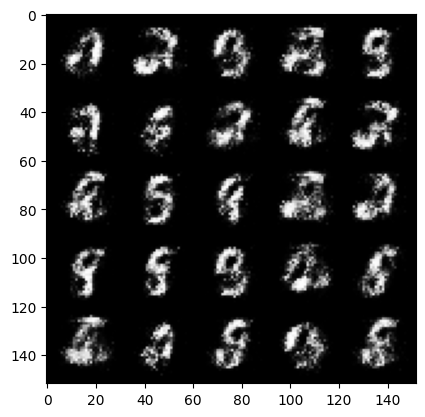

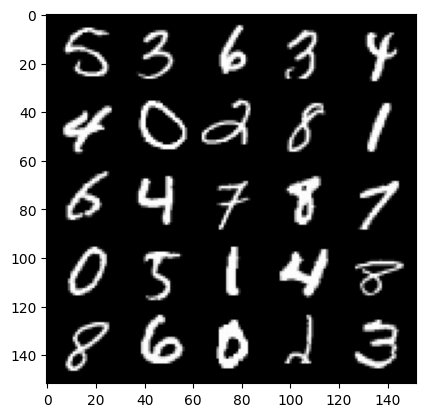

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 3.983958876132966, discriminator loss: 0.0817683957517146


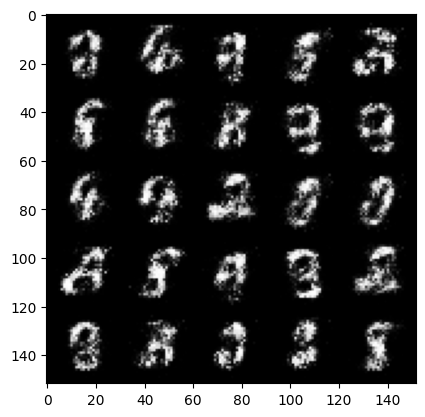

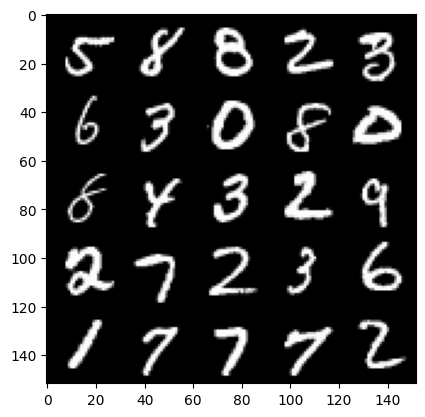

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.9708181285858166, discriminator loss: 0.08225516224652525


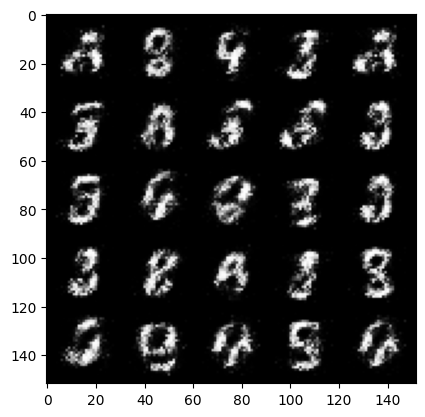

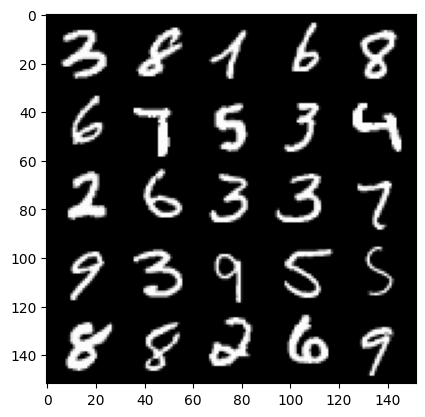

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.885847238540649, discriminator loss: 0.08918161381036048


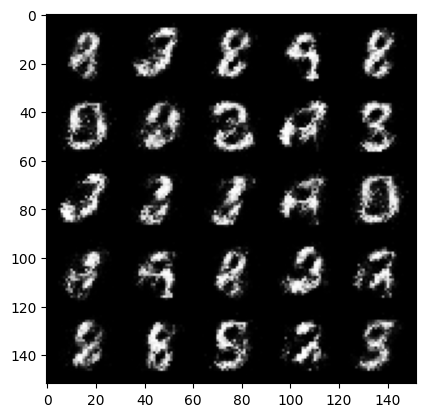

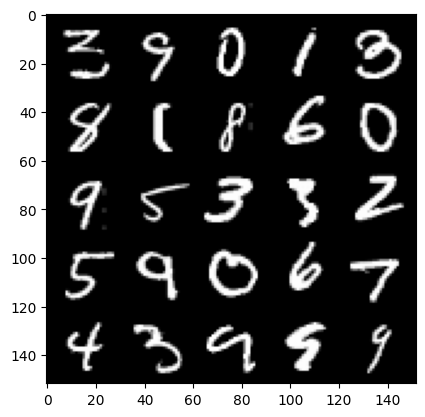

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.7282613706588767, discriminator loss: 0.10045423183590177


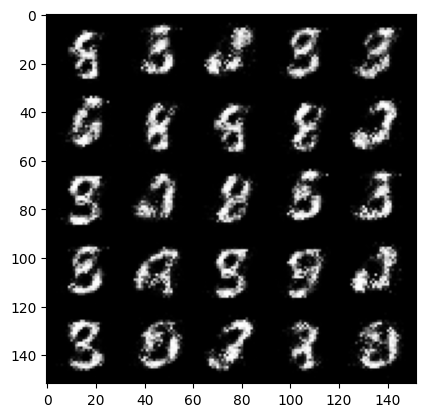

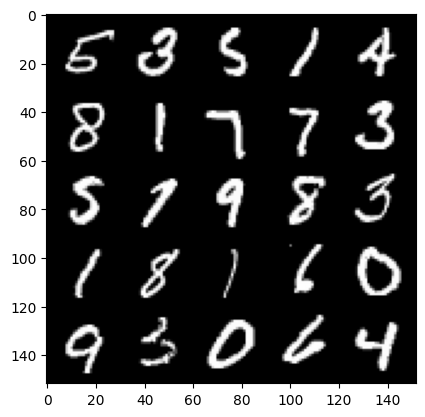

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.7775251169204713, discriminator loss: 0.0990550137534738


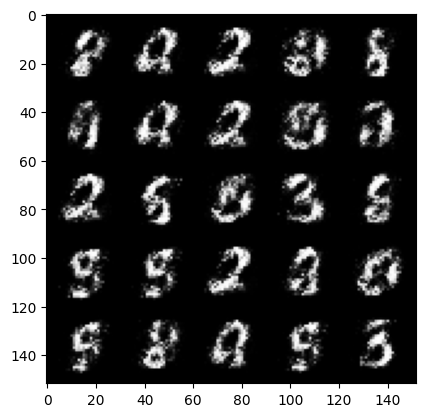

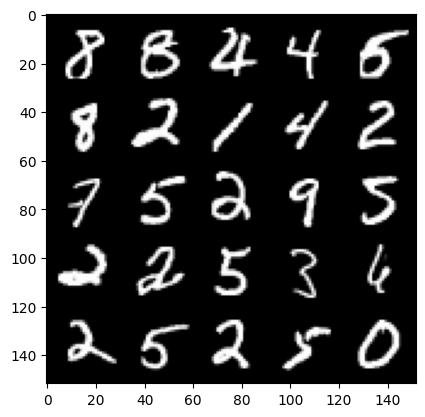

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.9478056449890144, discriminator loss: 0.0956630617231132


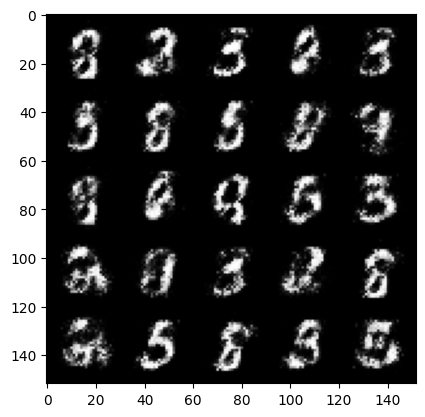

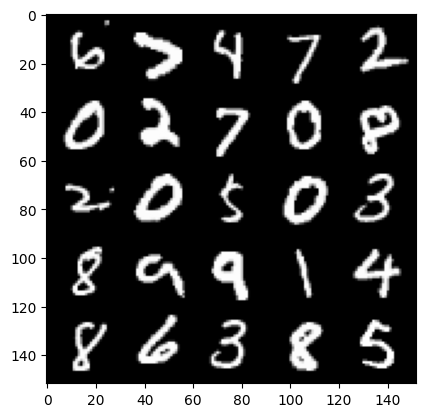

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.655069009780883, discriminator loss: 0.11693424141407013


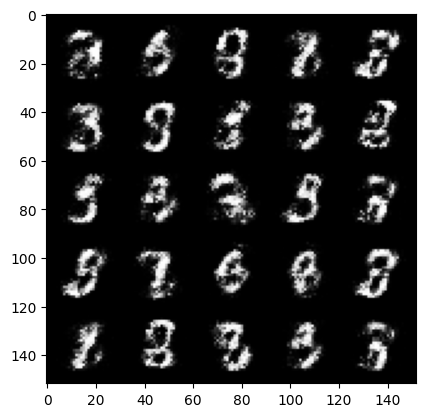

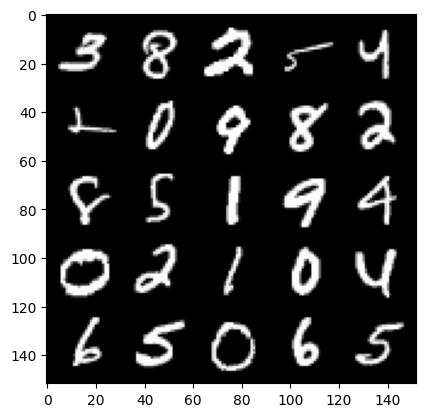

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.5044526815414465, discriminator loss: 0.11706565043330186


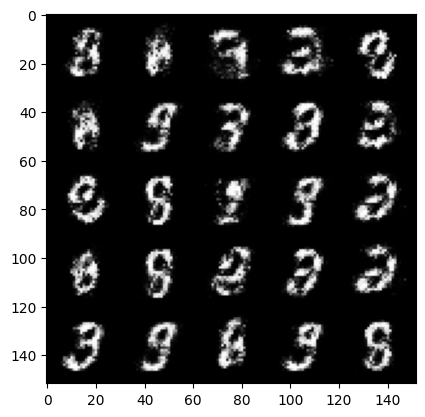

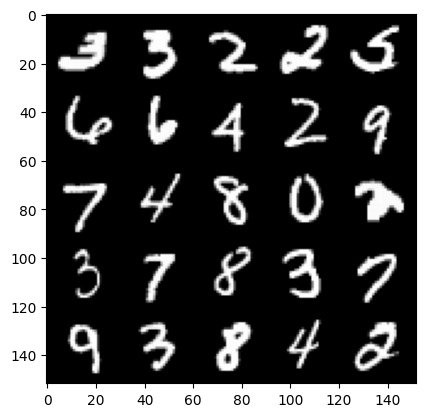

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.6237856855392443, discriminator loss: 0.10872345423698414


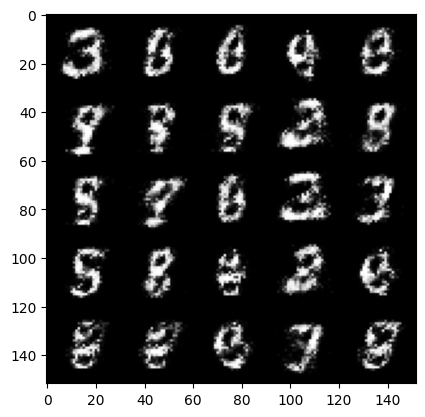

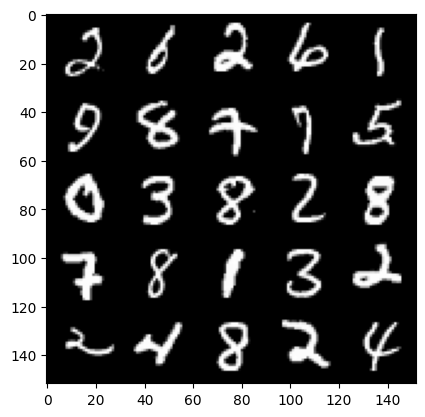

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.893754261970519, discriminator loss: 0.10668201387673626


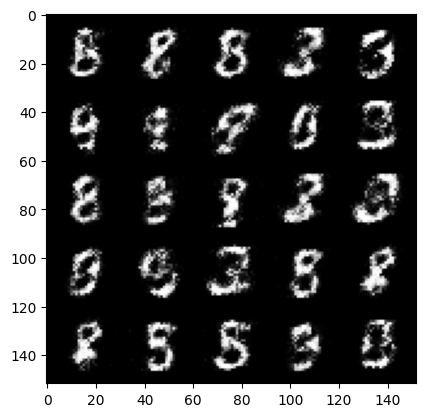

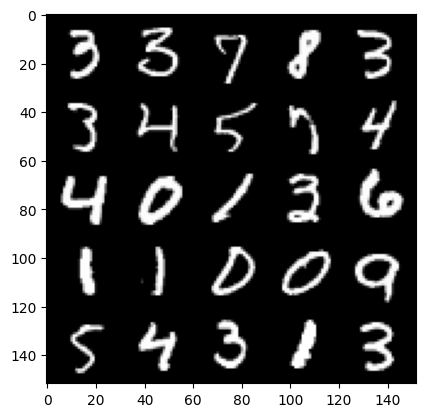

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.718450179100034, discriminator loss: 0.12194387206435205


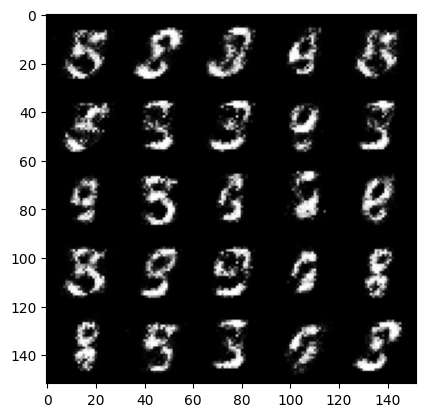

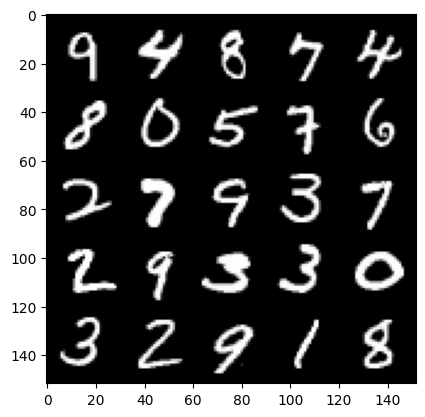

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.5173598318099977, discriminator loss: 0.1355367270484565


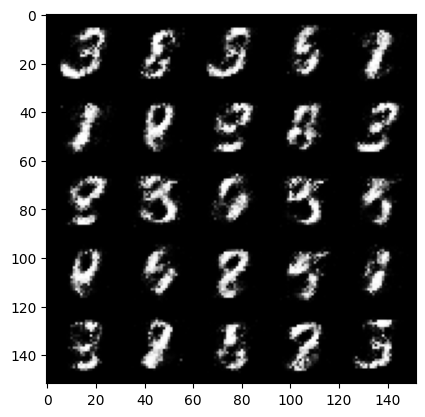

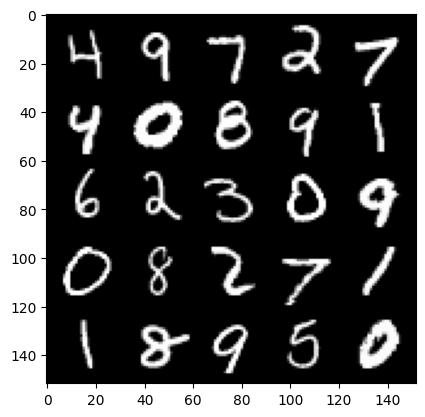

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.6466636533737176, discriminator loss: 0.12090764376521106


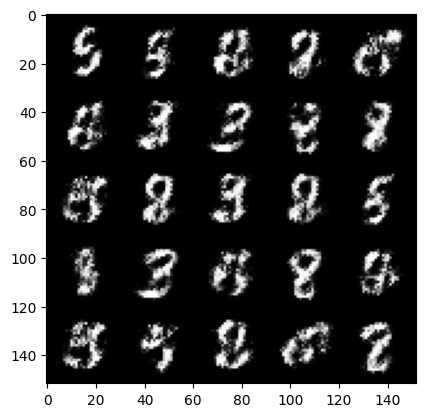

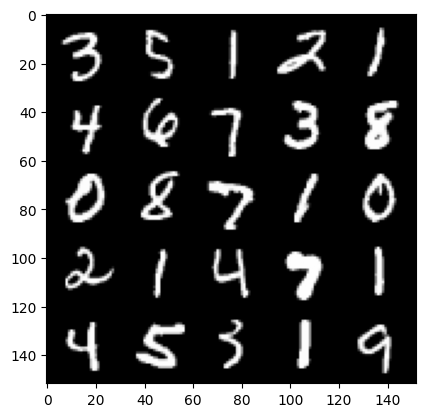

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.577483723640442, discriminator loss: 0.15153073778748508


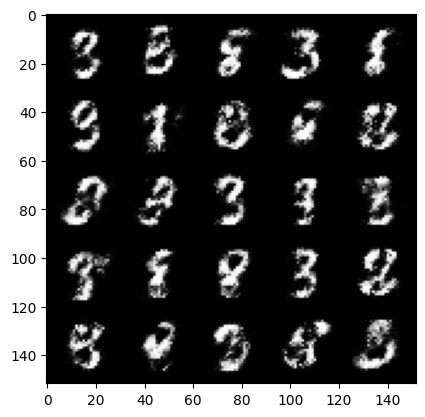

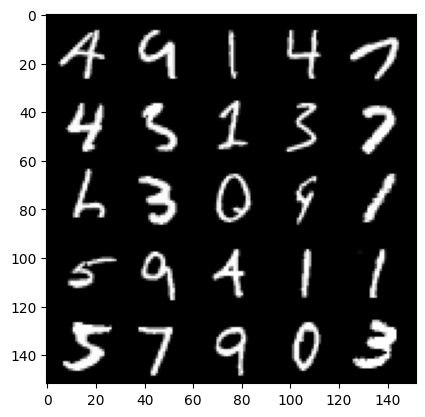

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.453767300128941, discriminator loss: 0.14944530998170374


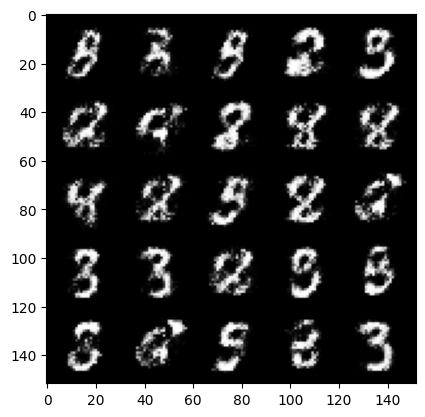

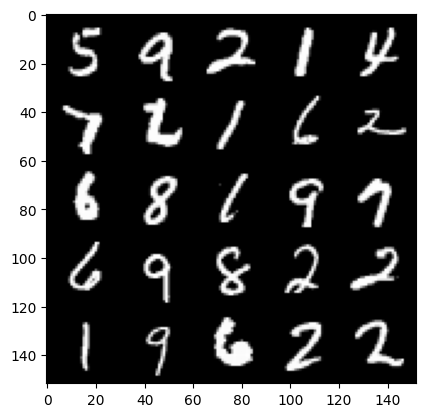

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.3738712315559374, discriminator loss: 0.15683948665857322


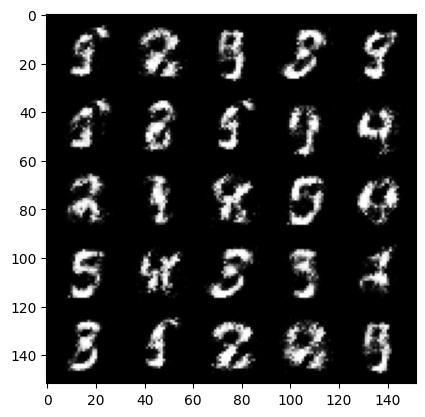

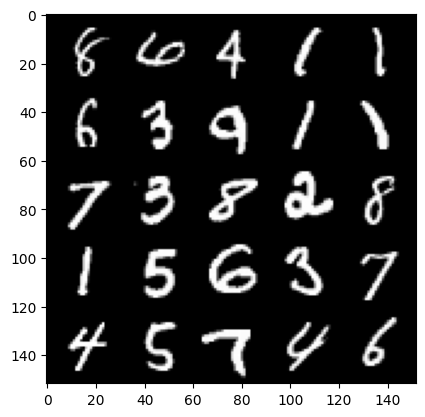

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.2906675958633436, discriminator loss: 0.15684389190375803


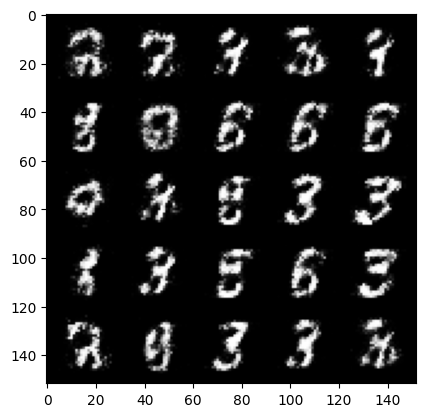

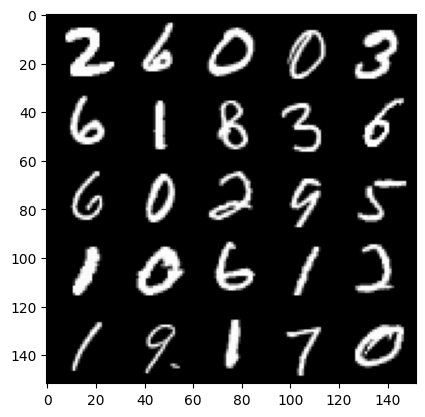

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.3872209544181806, discriminator loss: 0.16146245890855798


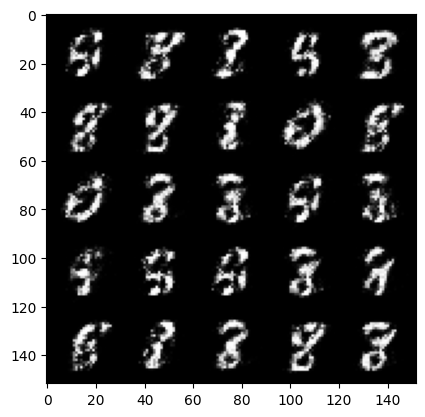

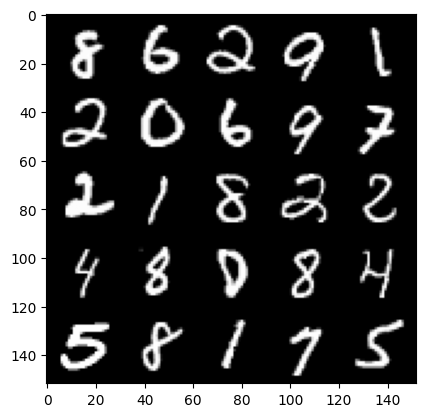

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.426133410930633, discriminator loss: 0.1552832035124303


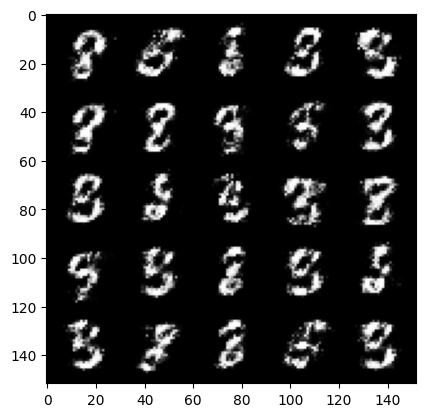

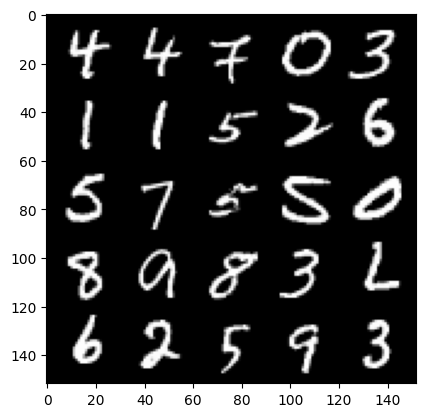

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.176231412410739, discriminator loss: 0.17430529311299328


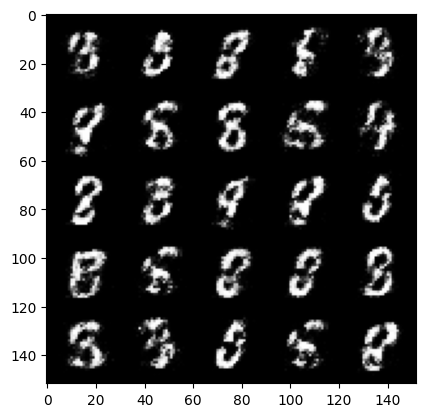

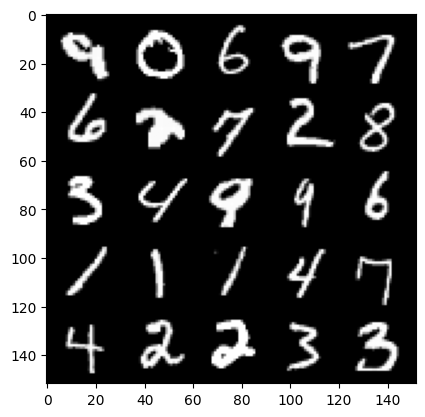

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.225290677547452, discriminator loss: 0.16609673401713368


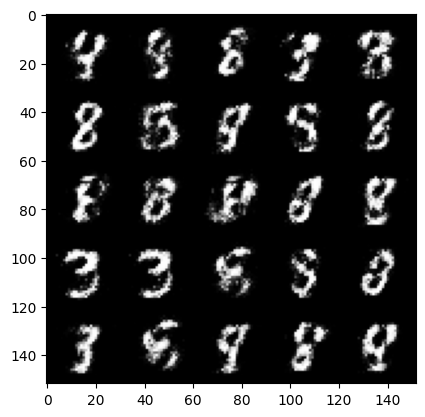

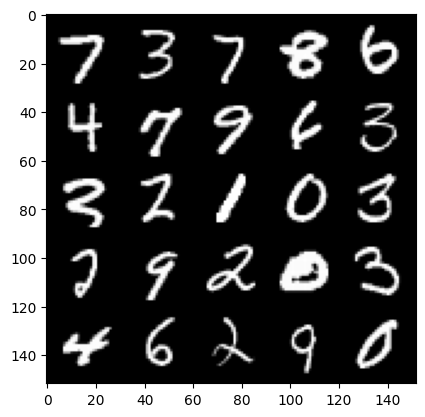

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.422310811996459, discriminator loss: 0.1518807524144649


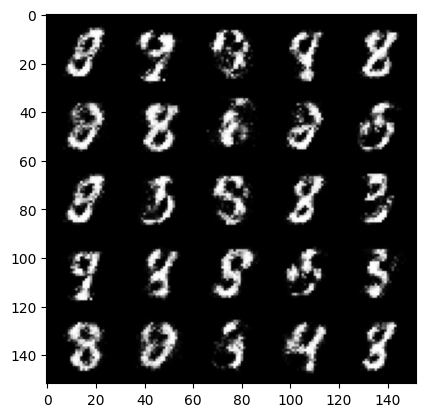

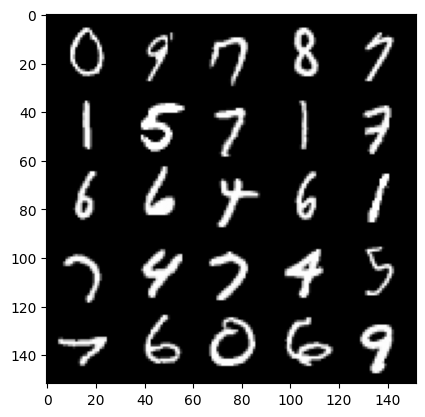

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.330558667659757, discriminator loss: 0.17300176648795593


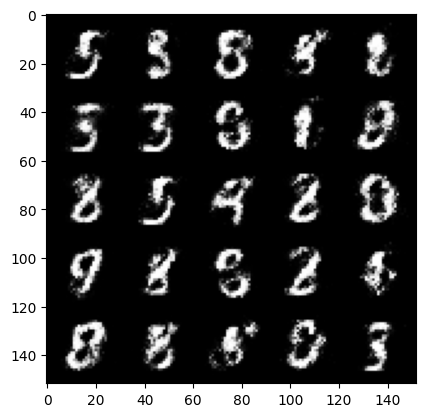

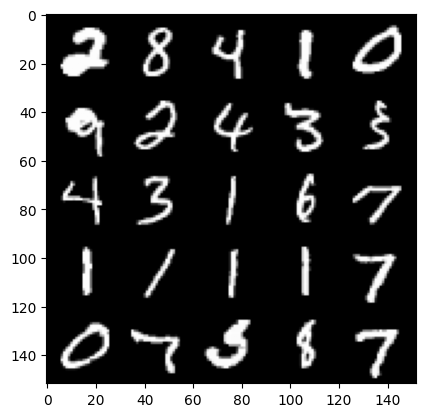

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.102051607131958, discriminator loss: 0.17487457050383096


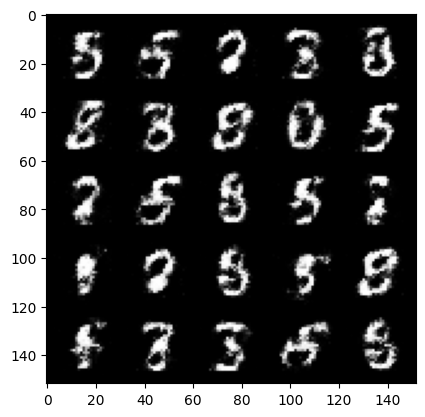

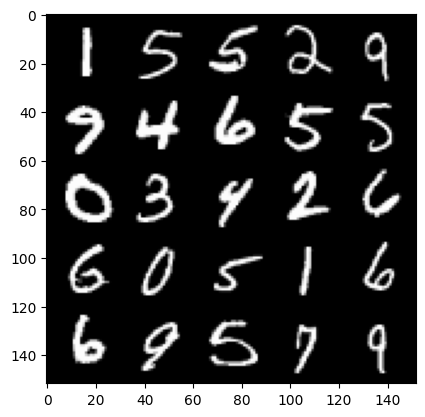

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 3.1369823827743546, discriminator loss: 0.16706438773870463


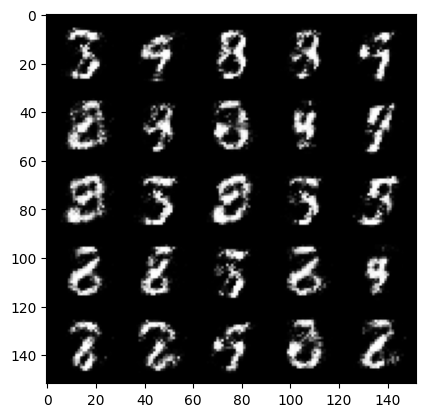

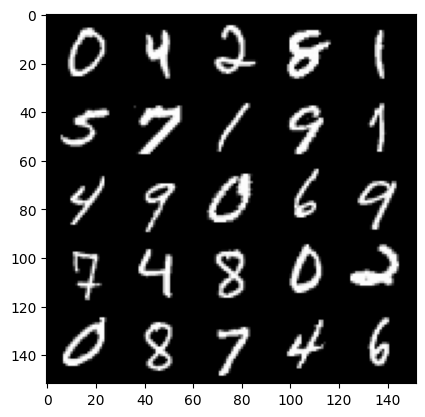

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 3.055569649219513, discriminator loss: 0.1816354691684246


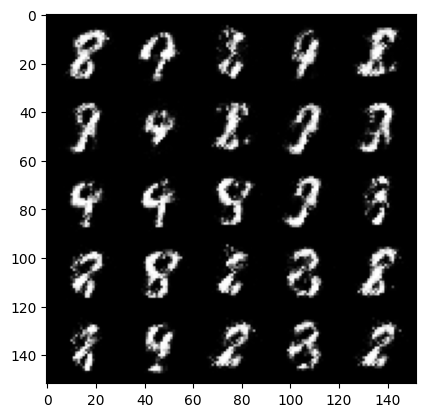

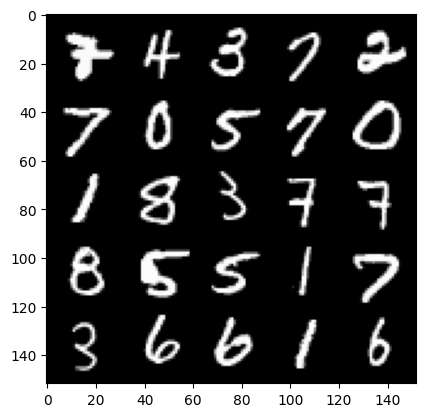

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 3.009722947597501, discriminator loss: 0.2042129011750221


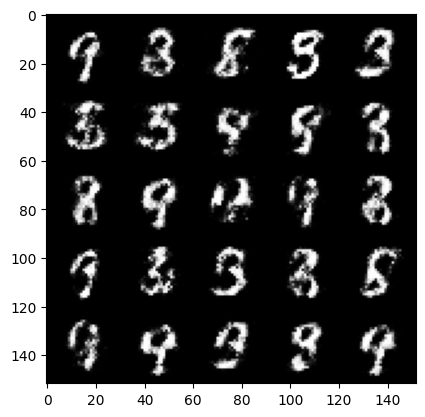

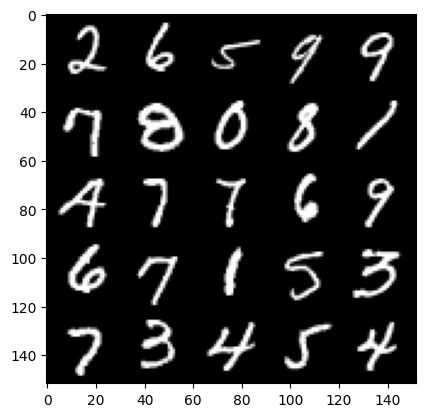

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.9139492912292475, discriminator loss: 0.20723256045579913


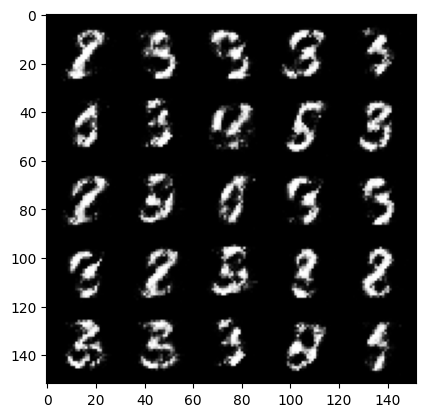

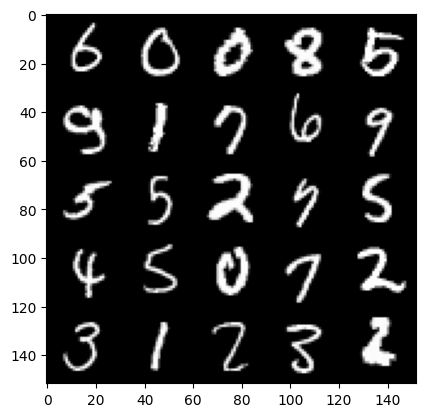

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.7295805320739746, discriminator loss: 0.22024089354276677


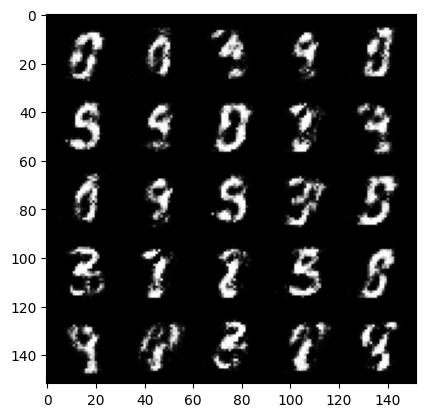

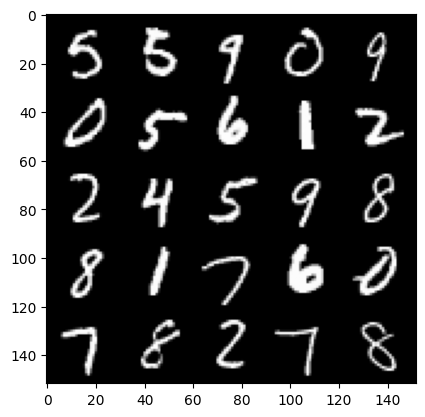

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.8606683611869794, discriminator loss: 0.21170267122983932


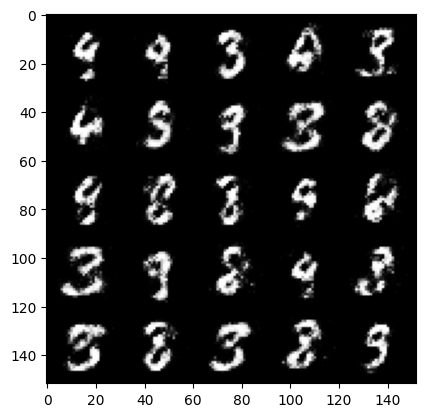

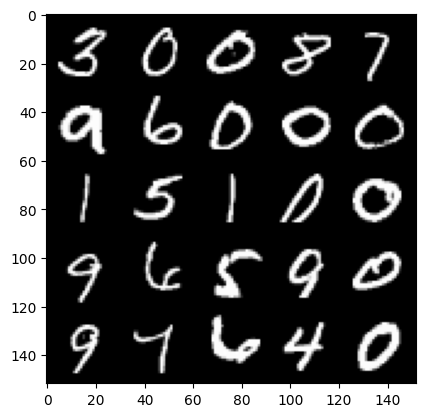

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.8544584870338467, discriminator loss: 0.2184250600934029


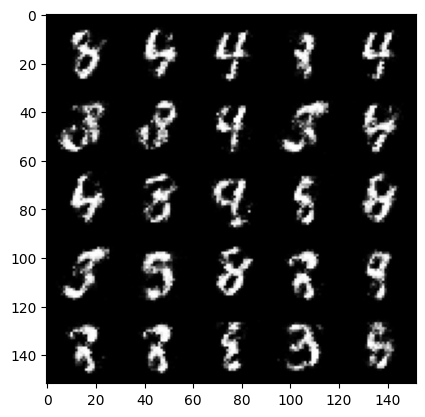

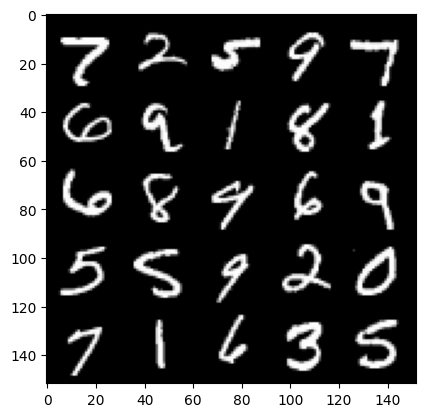

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.9164807476997394, discriminator loss: 0.1956195222586394


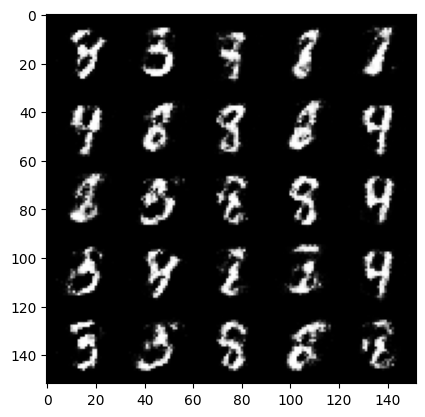

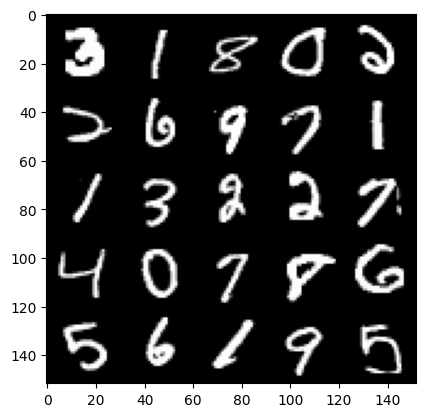

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.946223594188694, discriminator loss: 0.19938020630180842


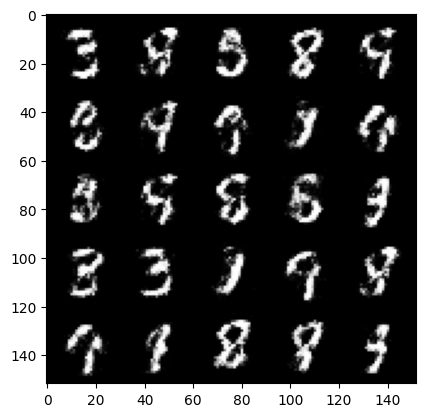

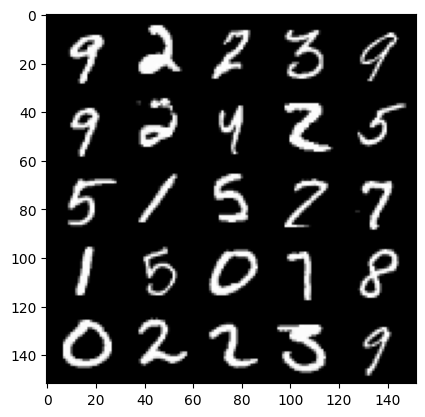

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.8123674640655523, discriminator loss: 0.214331001803279


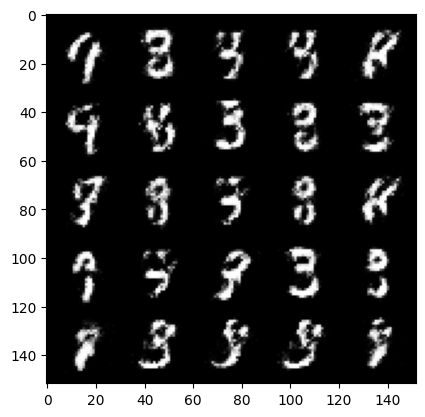

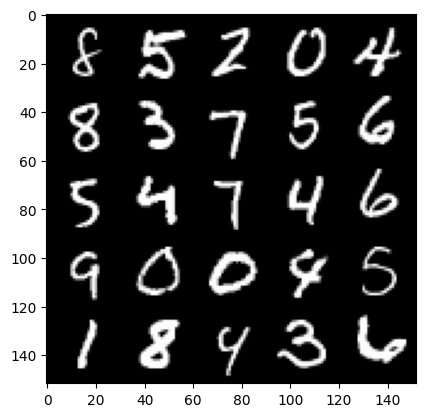

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.785360743045809, discriminator loss: 0.2235321125537158


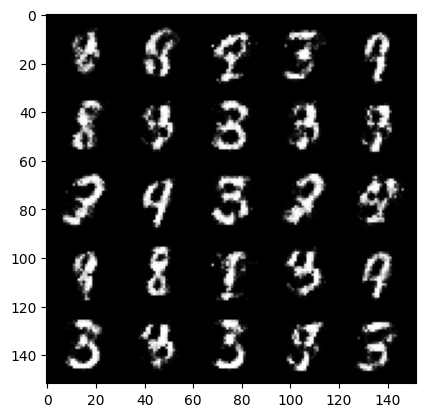

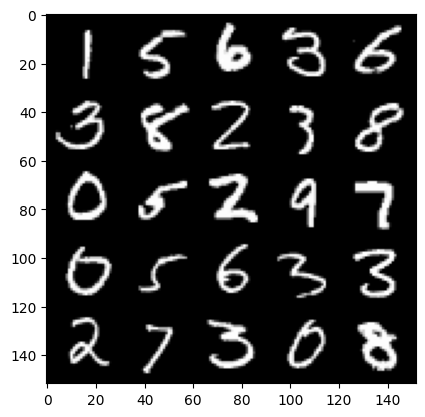

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.680816141605376, discriminator loss: 0.2271174616813659


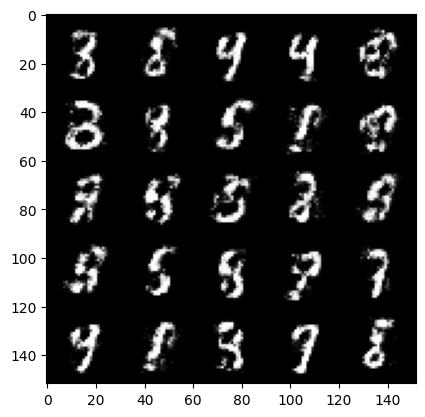

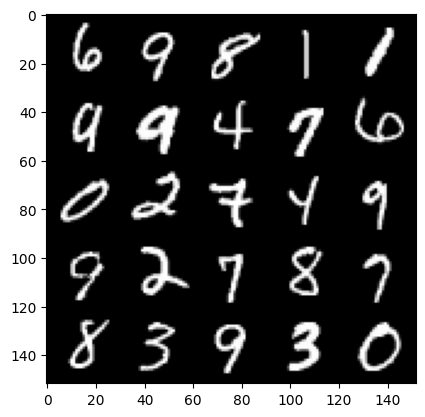

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.732979196071623, discriminator loss: 0.20473324348032487


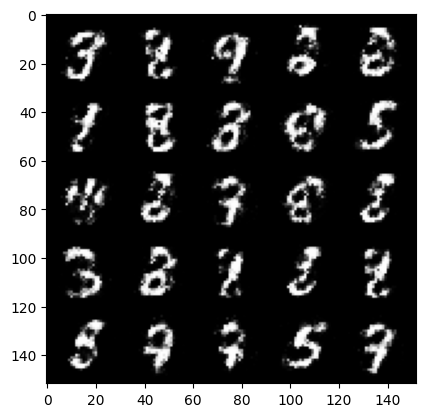

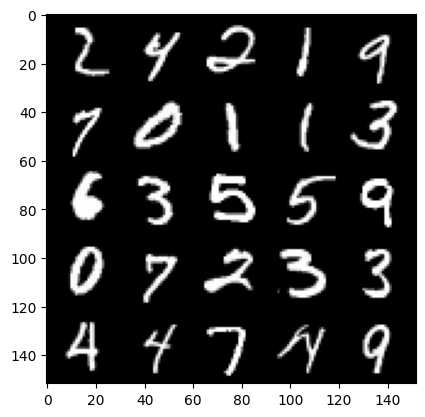

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.711060701847075, discriminator loss: 0.23127166581153866


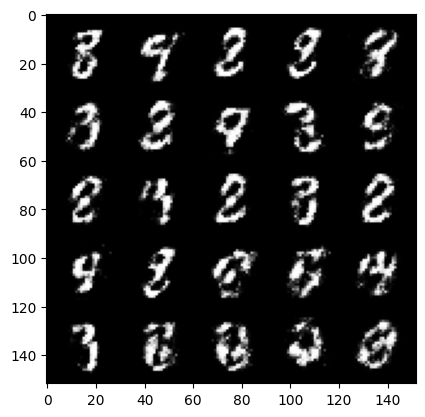

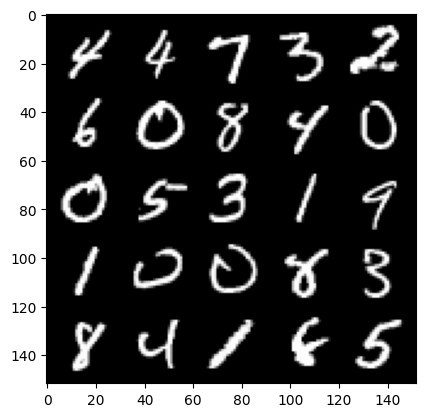

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.5695605401992796, discriminator loss: 0.24669225063920017


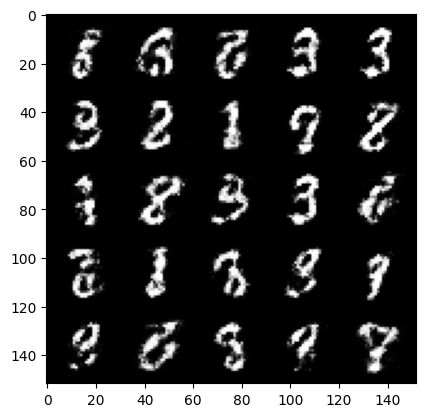

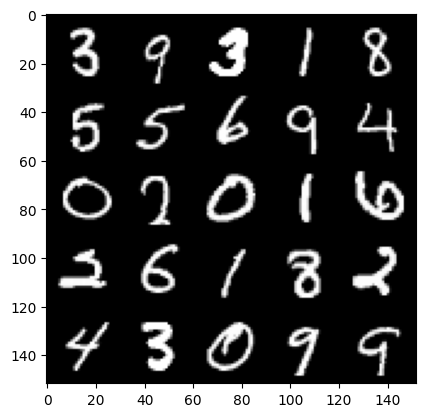

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.611180111408233, discriminator loss: 0.23436271959543234


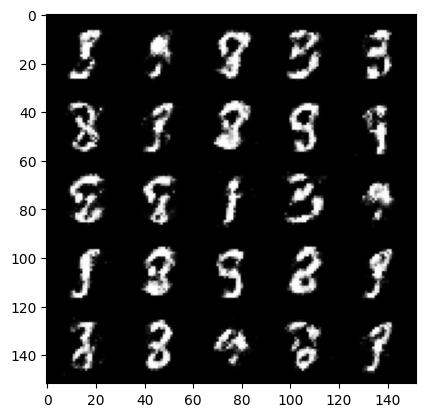

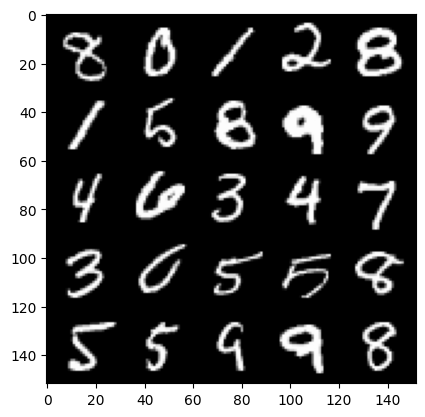

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.5768920826911894, discriminator loss: 0.2343763000369073


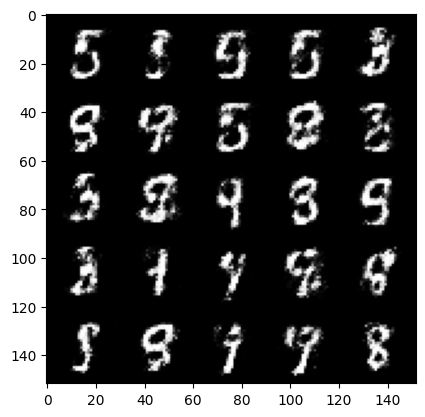

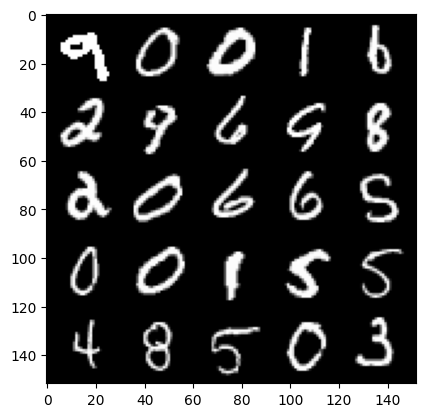

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.6219071173667907, discriminator loss: 0.21746955221891426


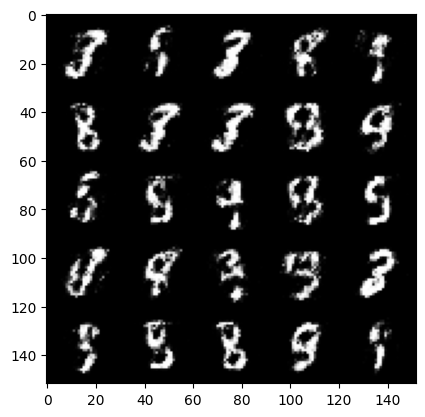

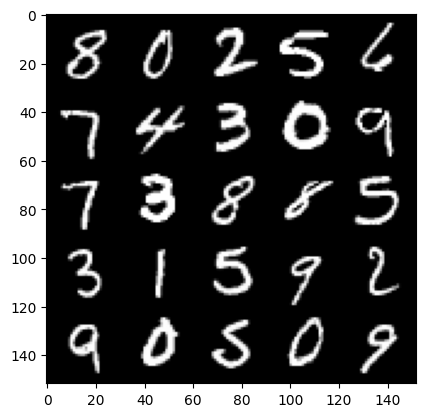

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.557062631607059, discriminator loss: 0.2454035459160804


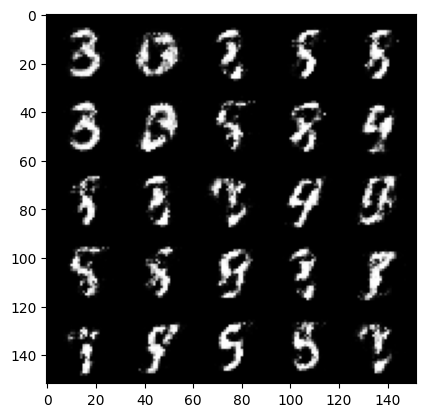

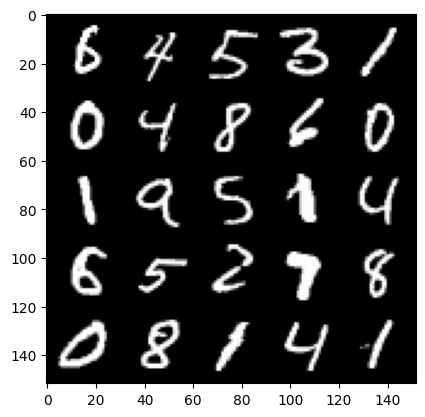

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.5644262859821323, discriminator loss: 0.23996755254268626


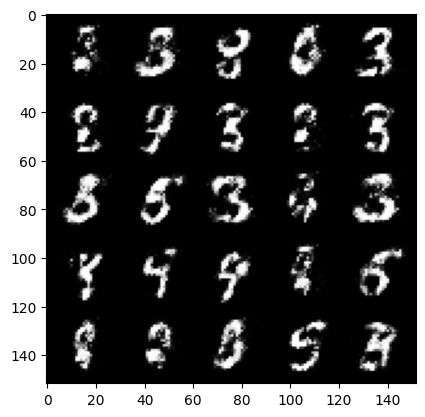

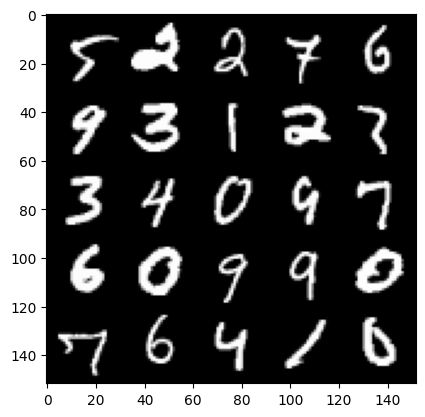

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.5882759599685667, discriminator loss: 0.24538991883397085


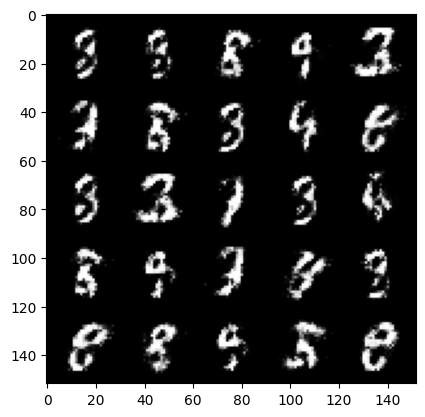

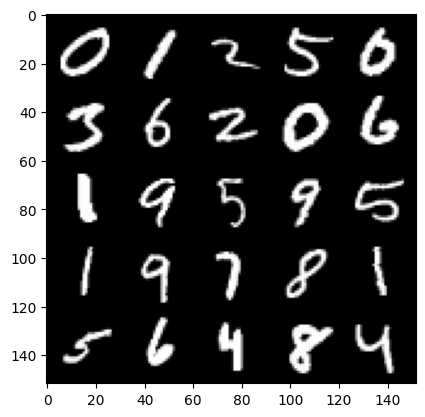

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.625950625419616, discriminator loss: 0.2394911560714244


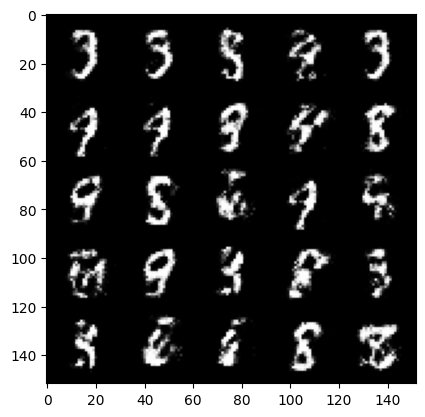

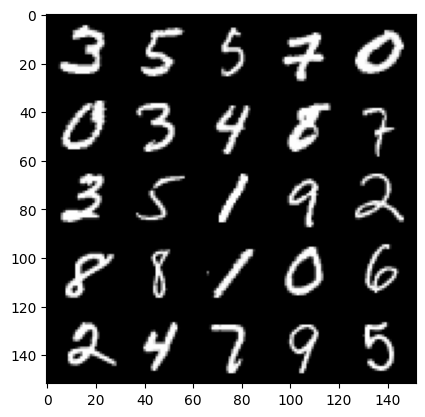

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.521547651529312, discriminator loss: 0.2553701213002206


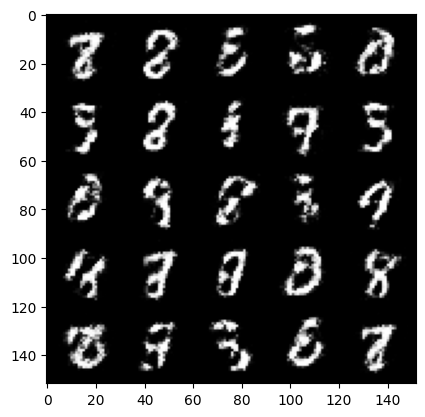

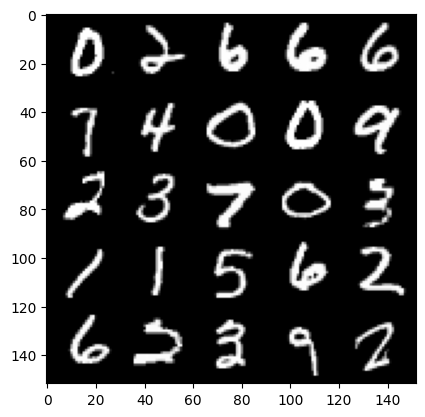

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.5113896555900572, discriminator loss: 0.272822771459818


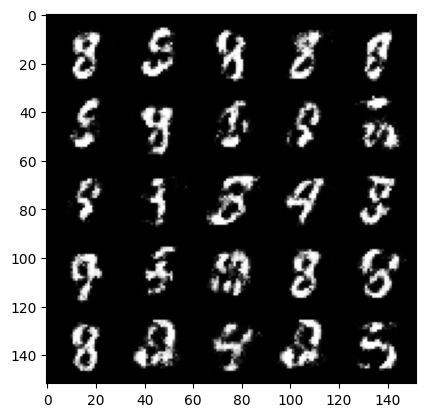

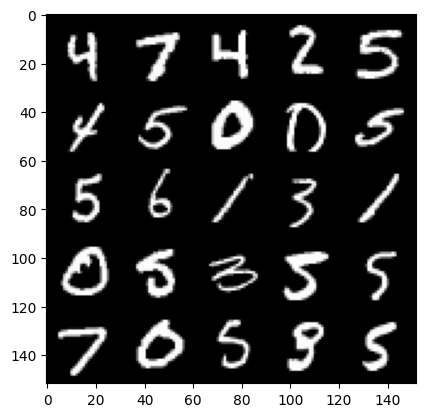

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.4099954590797426, discriminator loss: 0.2655003996193409


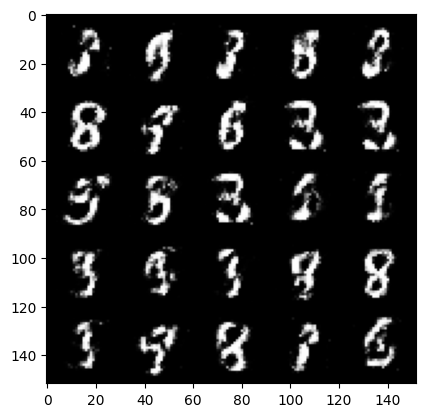

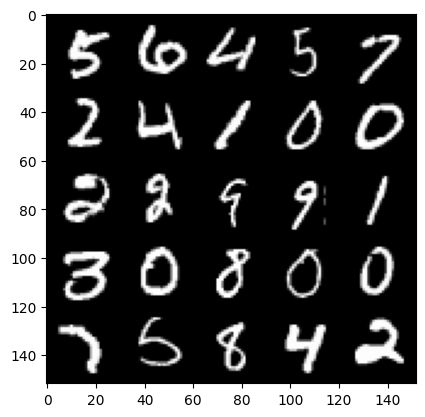

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.545768088817597, discriminator loss: 0.24441400966048238


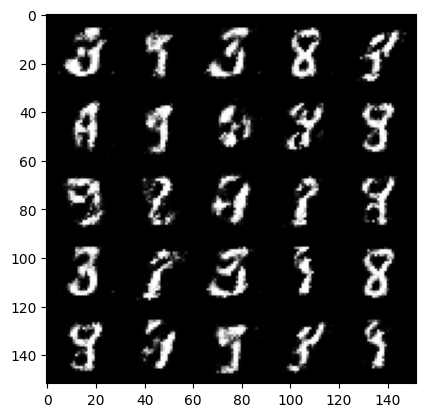

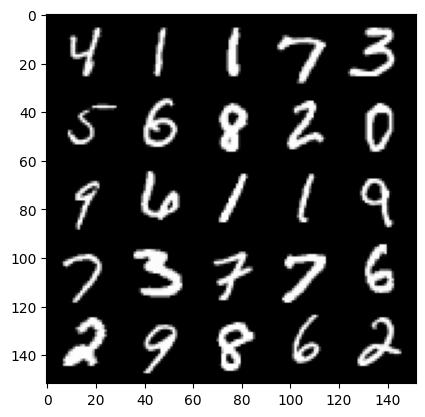

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.527744793653486, discriminator loss: 0.24663127344846705


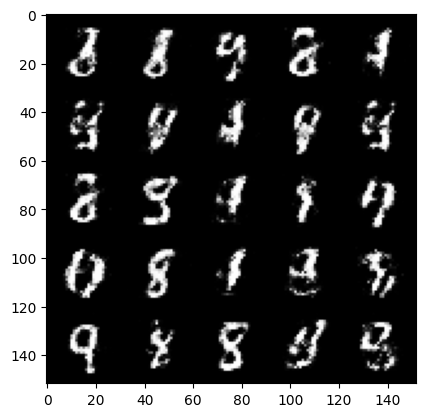

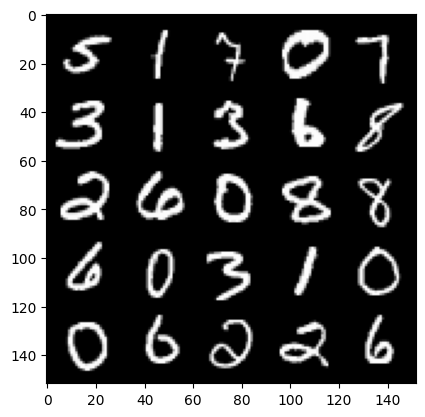

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.371768432378768, discriminator loss: 0.2638770378232001


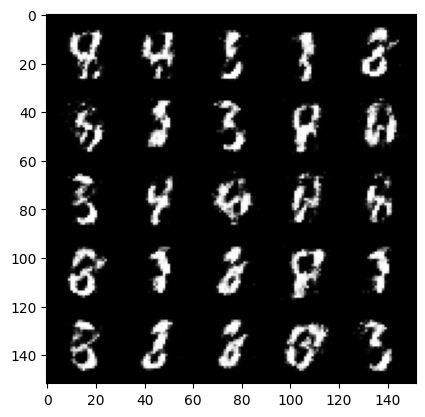

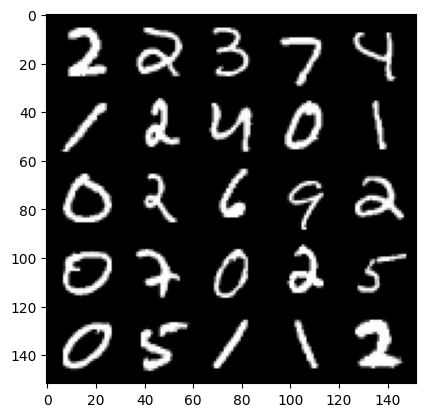

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.4636942634582537, discriminator loss: 0.24748485139012327


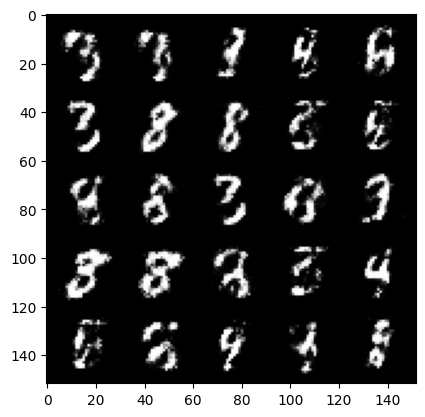

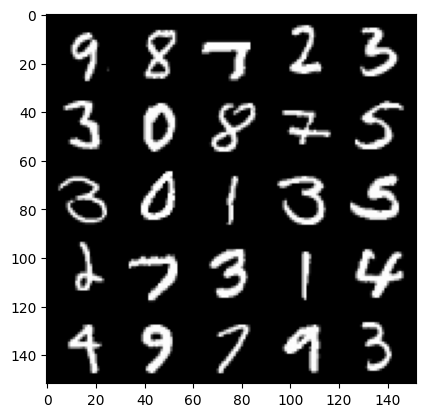

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.3748608982563013, discriminator loss: 0.2708920339643959


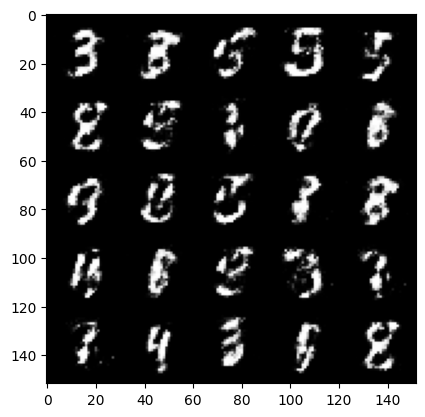

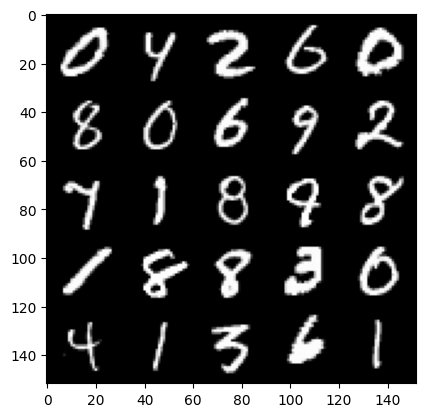

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.2750347783565537, discriminator loss: 0.2732992090284825


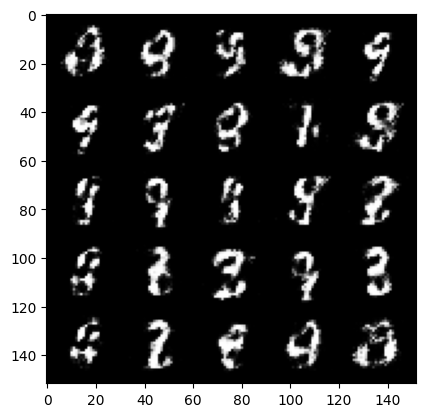

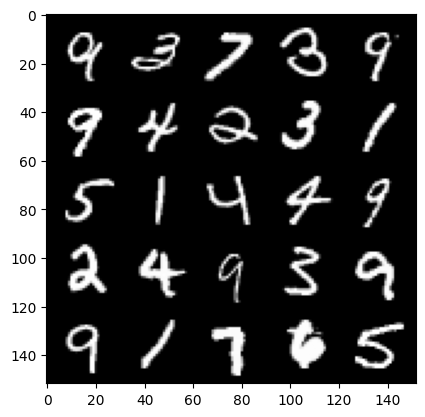

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.4440481429100034, discriminator loss: 0.25591028690338136


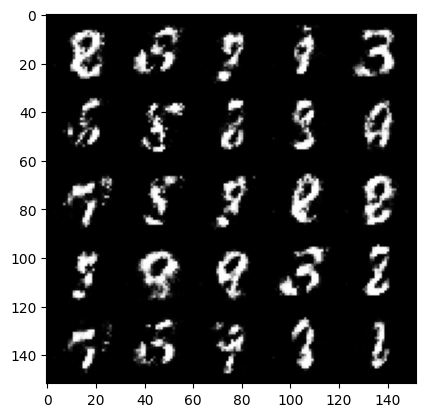

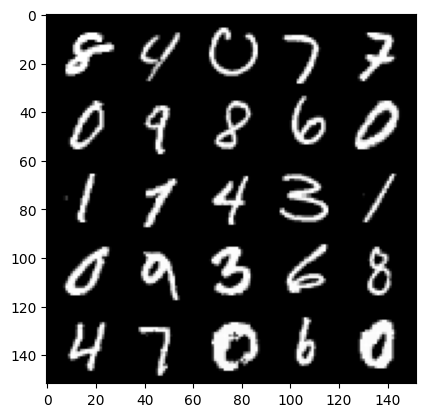

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.4126729648113274, discriminator loss: 0.2722584939897061


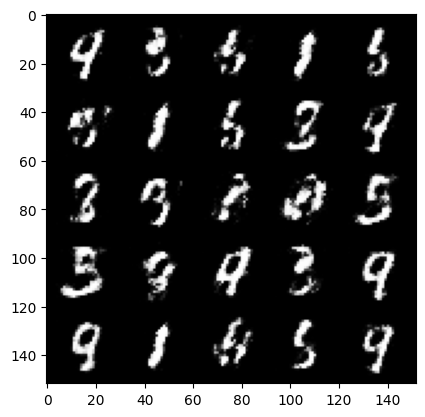

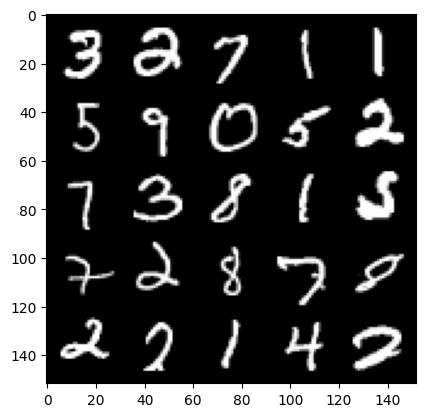

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.362920936584472, discriminator loss: 0.2665941590964793


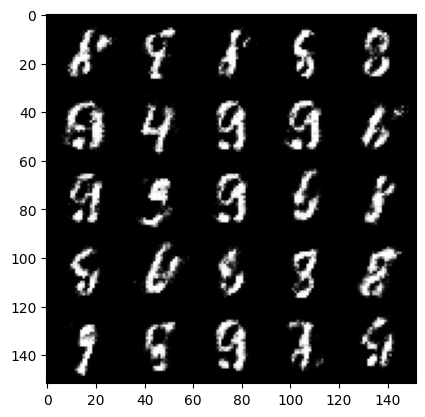

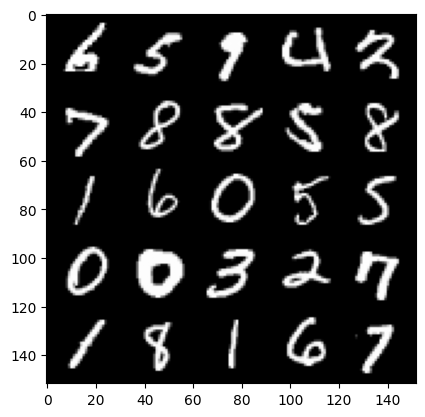

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.383500152349474, discriminator loss: 0.270940434575081


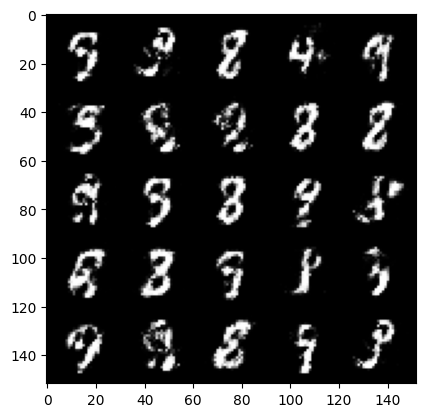

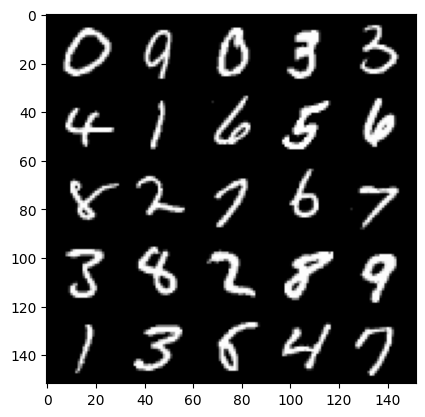

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.361905471086501, discriminator loss: 0.294798347234726


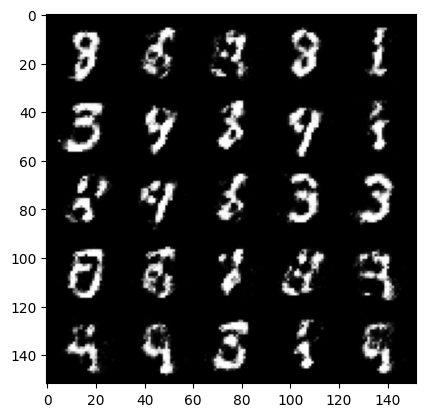

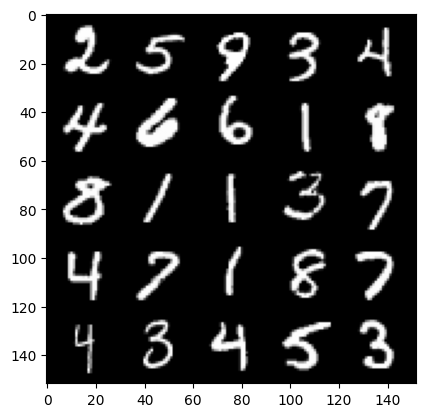

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.24850906038284, discriminator loss: 0.2991965389847756


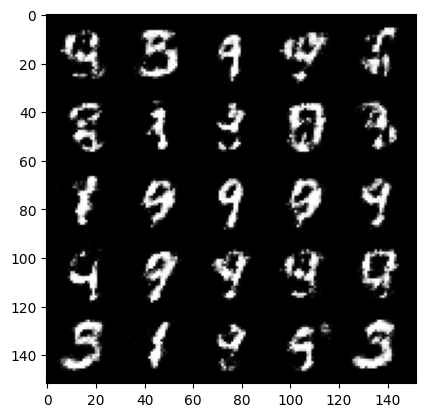

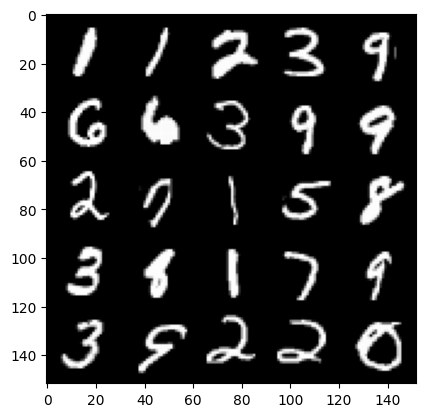

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 2.2640923566818256, discriminator loss: 0.29449510130286194


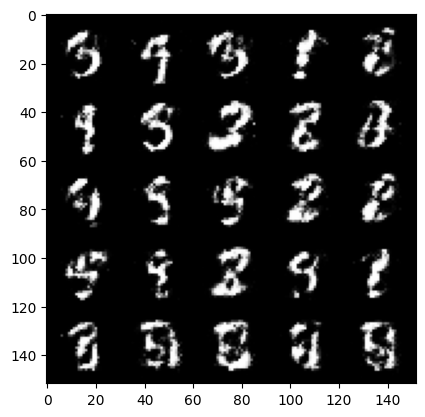

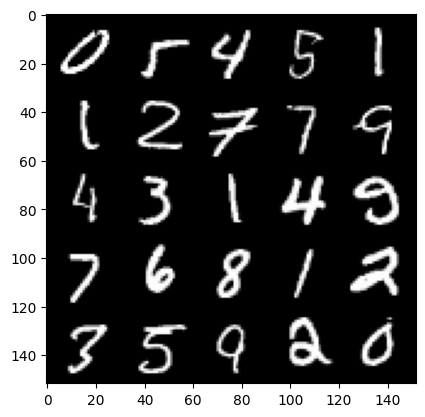

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.2502785139083876, discriminator loss: 0.2872942715585236


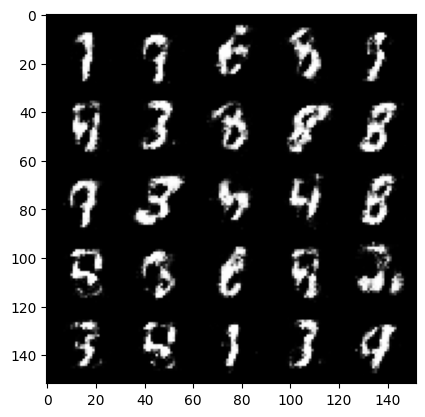

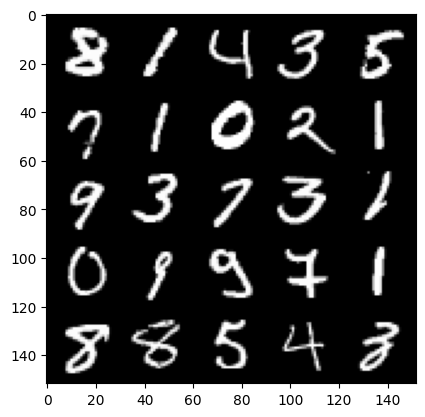

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.303019417762756, discriminator loss: 0.27367389270663245


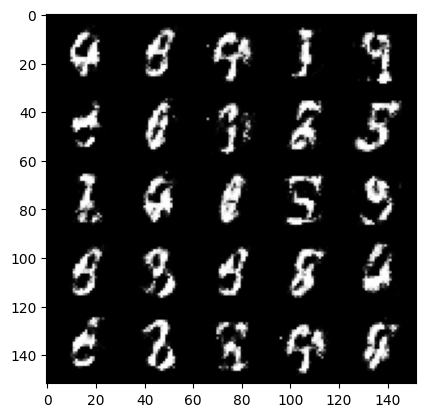

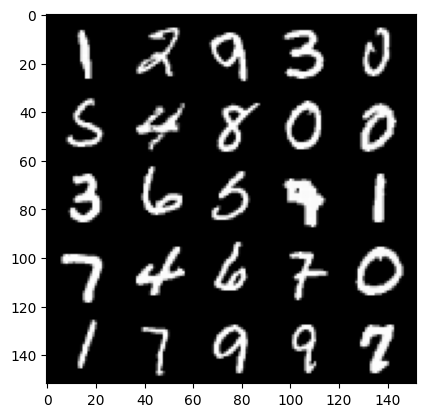

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.320185777187351, discriminator loss: 0.2684117871522903


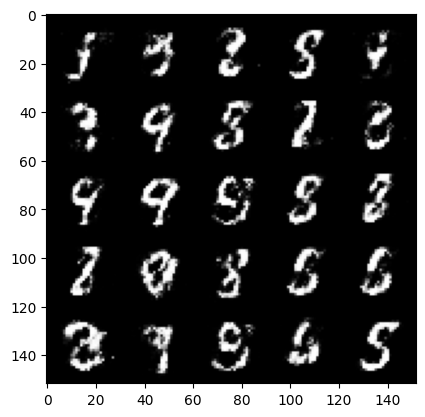

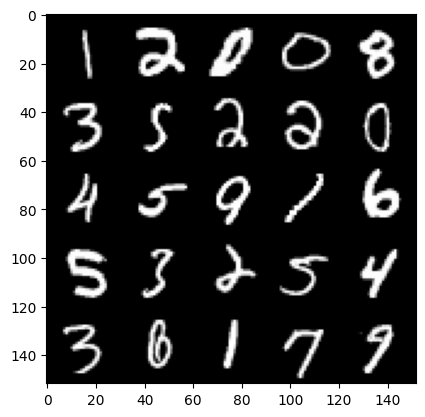

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 2.1992806324958805, discriminator loss: 0.3043973993659016


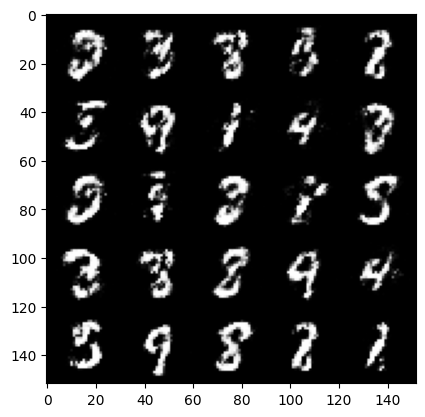

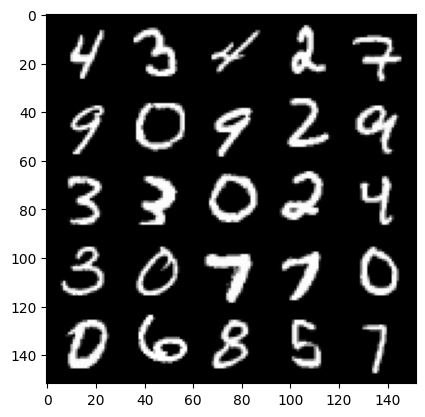

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.2130375454425817, discriminator loss: 0.30232691559195557


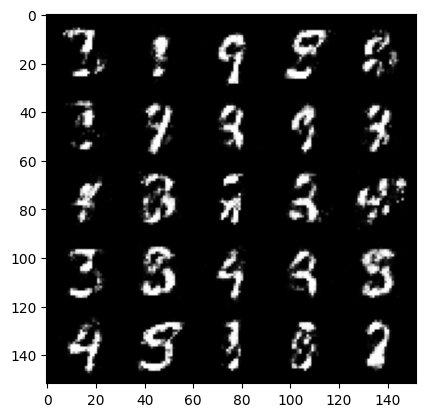

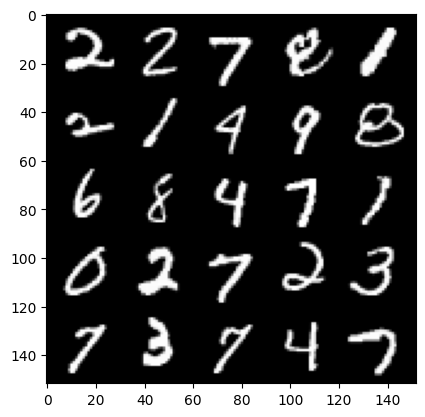

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 2.0571673314571375, discriminator loss: 0.32572194749116906


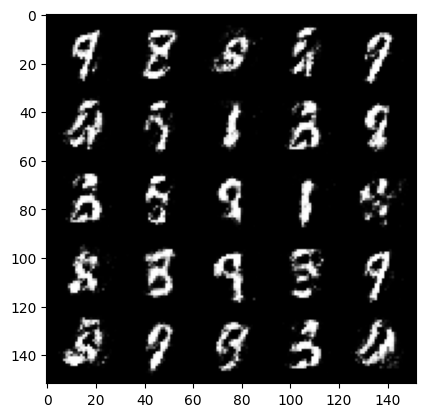

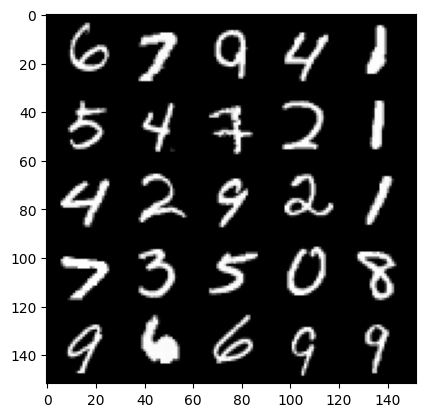

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 2.115001610517502, discriminator loss: 0.30349225264787694


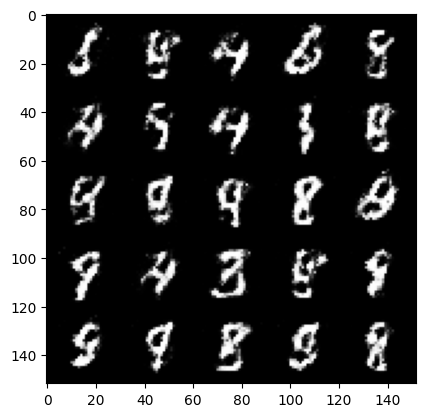

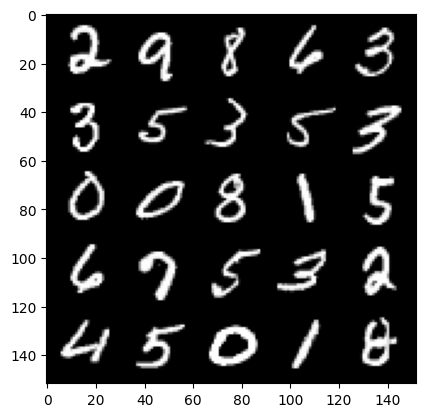

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 2.1911867454051976, discriminator loss: 0.30561611881852174


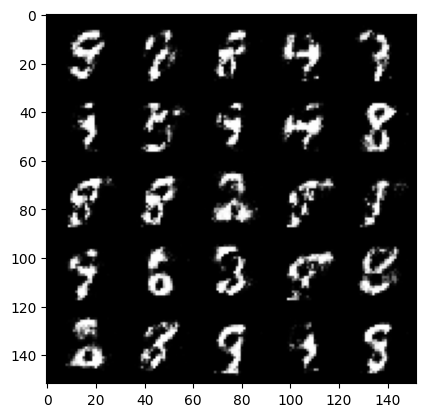

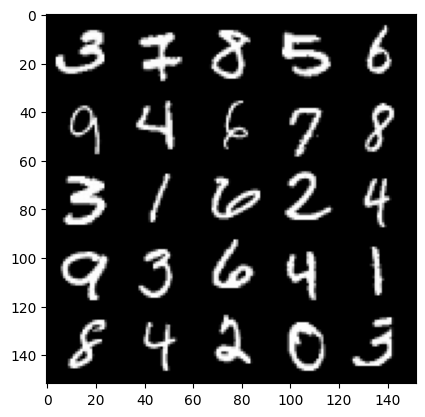

In [13]:
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
   
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1